<a href="https://colab.research.google.com/github/AlexTsev/DeepLearning/blob/master/PyAudioAnalysis_AudioEmotionAnalysis_Ravdess.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Necessary Libraries**

In [1]:
!pip install pyAudioAnalysis
!pip install pydub
!pip install eyed3

     |████████████████████████████████| 41.2MB 68kB/s 
  Created wheel for pyAudioAnalysis: filename=pyAudioAnalysis-0.3.5-cp36-none-any.whl size=41161776 sha256=b1981a275dcd2f12b08943849a588e6d3db91ca995fcc38fbdb8ef709f281f5a
  Stored in directory: /root/.cache/pip/wheels/7d/6f/10/fa7739a0f0de564fdf368cff6102060f845f1e734bc670d35d
Successfully built pyAudioAnalysis
     |████████████████████████████████| 153kB 2.8MB/s 


In [2]:
import librosa
from librosa import display
import matplotlib.pyplot as plt
import numpy as np
import os.path
import glob
import pandas as pd
import glob
import time
import cv2 as cv
import scipy

from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
import random
import tensorflow.keras
from tensorflow.keras import utils
#import keras
#from keras.utils import np_utils
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv1D, MaxPool1D, MaxPooling1D
from tensorflow.keras.optimizers import SGD,RMSprop,Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.metrics
import tensorflow.keras.callbacks  as callbacks
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from pyAudioAnalysis import MidTermFeatures as aF
from pyAudioAnalysis import audioBasicIO
import joblib

from pyAudioAnalysis.MidTermFeatures  import directory_feature_extraction as dW

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,confusion_matrix
#from sklearn.tree import convert_to_graphviz
from io import StringIO
import IPython
from IPython.display import Image
import pydotplus
from sklearn.tree import export_graphviz
import graphviz

import scipy.io.wavfile as wavfile
import plotly
import plotly.express as px
from plotly.graph_objs import *
import plotly.graph_objs as go
from pyAudioAnalysis import ShortTermFeatures as aFs
import scipy.fft as scp
import plotly.io as pio
from plotly.subplots import make_subplots 
pio.renderers.default = 'colab'
from plotly.offline import iplot, init_notebook_mode
from google.colab.patches import cv2_imshow
from plotly import express as xp
#init_notebook_mode(connected = True)

In [3]:
from google.colab import files
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
/gdrive


# **Information about Dataset's songs**

**We will replace the emotion IDs because we need them to start by 0 :**

00 = neutral, 01 = calm, 02 = happy, 03 = sad, 04 = angry, 05 = fearful, 06 = disgust, 07 = surprised

Modality (01 = full-AV, 02 = video-only, 03 = audio-only).

Vocal channel (01 = speech, 02 = song).

Emotion (01 = neutral, 02 = calm, 03 = happy, 04 = sad, 05 = angry, 06 = fearful, 07 = disgust, 08 = surprised).

Emotional intensity (01 = normal, 02 = strong). NOTE: There is no strong 

intensity for the 'neutral' emotion.

Statement (01 = "Kids are talking by the door", 02 = "Dogs are sitting by the door").

Repetition (01 = 1st repetition, 02 = 2nd repetition).

Actor (01 to 24. Odd numbered actors are male, even numbered actors are female).

# **LOAD UTILITIES**

**Changed Plotly functions to work with colab**

In [4]:
"""! 
@brief Utilities
@details General purpose routines
@author Theodoros Giannakopoulos {tyiannak@gmail.com}
"""

import plotly.io as pio
#pio.renderers.default = 'colab'
from plotly.offline import iplot, init_notebook_mode
import plotly
import plotly.graph_objs as go

import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
from sklearn.metrics import mean_squared_error, mean_absolute_error


def plot_feature_histograms(list_of_feature_mtr, feature_names,
                            class_names, n_columns=5):
    '''
    Plots the histograms of all classes and features for a given
    classification task.
    :param list_of_feature_mtr: list of feature matrices
                                (n_samples x n_features) for each class
    :param feature_names:       list of feature names
    :param class_names:         list of class names, for each feature matr
    '''
    n_features = len(feature_names)
    n_bins = 12
    n_rows = int(n_features / n_columns) + 1
    figs = make_subplots(rows=n_rows, cols=n_columns, subplot_titles=feature_names)
    figs['layout'].update(height=(n_rows * 250))
    clr = get_color_combinations(len(class_names))
    for i in range(n_features):
        # for each feature get its bin range (min:(max-min)/n_bins:max)
        f = np.vstack([x[:, i:i + 1] for x in list_of_feature_mtr])
        bins = np.arange(f.min(), f.max(), (f.max() - f.min()) / n_bins)
        for fi, f in enumerate(list_of_feature_mtr):
            # load the color for the current class (fi)
            mark_prop = dict(color=clr[fi], line=dict(color=clr[fi], width=3))
            # compute the histogram of the current feature (i) and normalize:
            h, _ = np.histogram(f[:, i], bins=bins)
            h = h.astype(float) / h.sum()
            cbins = (bins[0:-1] + bins[1:]) / 2
            scatter_1 = go.Scatter(x=cbins, y=h, name=class_names[fi], marker=mark_prop, showlegend=(i == 0))
            # (show the legend only on the first line)
            figs.append_trace(scatter_1, int(i/n_columns)+1, i % n_columns+1)
    for i in figs['layout']['annotations']:
        i['font'] = dict(size=10, color='#224488')
    #layout = figs['layout']
    iplot(figs)
    #config = {
    #          'grid' : {
    #            'layout': layout,
    #            'rows': n_rows,
    #            'columns': 5,
    #            'pattern': 'independent',
    #            'roworder': 'bottom to top',
    #            'format': 'colab', # one of png, svg, jpeg, webp
    #           'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
    #          }
    #         }
    #figs['layout'].update(height=(n_rows * 250), width=(5 * 250))
    #plotly.offline.iplot(figs, config=config, filename="/gdrive/My Drive/report.html")
    #figs.show()
    


def get_color_combinations(n_classes):
    clr_map = plt.cm.get_cmap('jet')
    range_cl = range(int(int(255/n_classes)/2), 255, int(255/n_classes))
    clr = []
    for i in range(n_classes):
        clr.append('rgba({},{},{},{})'.format(clr_map(range_cl[i])[0],
                                              clr_map(range_cl[i])[1],
                                              clr_map(range_cl[i])[2],
                                              clr_map(range_cl[i])[3]))
    return clr


def compute_class_rec_pre_f1(c_mat):
    '''
    :param c_mat: the [n_class x n_class] confusion matrix
    :return: rec, pre and f1 for each class
    '''
    n_class = c_mat.shape[0]
    rec, pre, f1 = [], [], []
    for i in range(n_class):
        rec.append(float(c_mat[i, i]) / np.sum(c_mat[i, :]))
        pre.append(float(c_mat[i, i]) / np.sum(c_mat[:, i]))
        f1.append(2 * rec[-1] * pre[-1] / (rec[-1] + pre[-1]))
    return rec,  pre, f1

def find_nearest(x,A):
    '''
    returns the closest element in an array
    '''
    return A[(np.abs(A-x)).argmin()]

def svm_train_evaluate(X, y, k_folds, C=1, use_regressor=False):
    '''
    :param X: Feature matrix
    :param y: Labels matrix
    :param k_folds: Number of folds
    :param C: SVM C param
    :param use_regressor: use svm regression for training (not nominal classes)
    :return: confusion matrix, average f1 measure and overall accuracy
    '''
    #classes 
    Y_classes=list(set(y))
    # normalize
    mean, std = X.mean(axis=0), np.std(X, axis=0)
    X = (X - mean) / std
    # k-fold evaluation:
    kf = KFold(n_splits=k_folds, shuffle=True)
    f1s, accs, count_cm = [], [], 0
    for train, test in kf.split(X):
        x_train, x_test, y_train, y_test = X[train], X[test], y[train], y[test]
        if not use_regressor:
            cl = SVC(kernel='rbf', C=C)
        else:
            cl = SVR(kernel='linear', C=C)
        cl.fit(x_train, y_train)
        y_pred = cl.predict(x_test)
        if use_regressor:
            for i,_ in enumerate(y_pred):
                y_pred[i]=find_nearest(y_pred[i],Y_classes)
        # update aggregated confusion matrix:
        if count_cm == 0:
            cm = confusion_matrix(y_pred=y_pred, y_true=y_test)
        else:
            cm += (confusion_matrix(y_pred=y_pred, y_true=y_test))
        count_cm += 1
        f1s.append(f1_score(y_pred=y_pred, y_true=y_test, average='micro'))
        accs.append(accuracy_score(y_pred=y_pred, y_true=y_test))
    f1 = np.mean(f1s)
    acc = np.mean(accs)
    return cm, f1, acc


def plotly_classification_results(cm, class_names):
    heatmap = go.Heatmap(z=np.flip(cm, axis=0), x=class_names,
                         y=list(reversed(class_names)),
                         colorscale=[[0, '#4422ff'], [1, '#ff4422']],
                         name="confusin matrix", showscale=False)
    rec, pre, f1 = compute_class_rec_pre_f1(cm)
    mark_prop1 = dict(color='rgba(150, 180, 80, 0.5)',
                      line=dict(color='rgba(150, 180, 80, 1)', width=2))
    mark_prop2 = dict(color='rgba(140, 200, 120, 0.5)',
                      line=dict(color='rgba(140, 200, 120, 1)', width=2))
    mark_prop3 = dict(color='rgba(50, 150, 220, 0.5)',
                      line=dict(color='rgba(50, 150, 220, 1)', width=3))
    b1 = go.Bar(x=class_names,  y=rec, name="rec", marker=mark_prop1)
    b2 = go.Bar(x=class_names,  y=pre, name="pre", marker=mark_prop2)
    b3 = go.Bar(x=class_names,  y=f1, name="f1", marker=mark_prop3)
    figs = make_subplots(rows=1, cols=2,
                                      subplot_titles=["Confusion matrix",
                                                      "Performance measures"])
    figs.append_trace(heatmap, 1, 1); figs.append_trace(b1, 1, 2)
    figs.append_trace(b2, 1, 2); figs.append_trace(b3, 1, 2)
    #iplot(figs)
    config = {
              'toImageButtonOptions': {
                'format': 'png', # one of png, svg, jpeg, webp
                'filename': 'custom_image',
                'height': 1200,
                'width': 900,
                'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
              }
            }
    figs.show('svg')

def svm_train_evaluate_regression(X, y, k_folds, C=1):
    '''
    :param X: Feature matrix
    :param y: Continous Labels matrix
    :param k_folds: Number of folds
    :param C: SVM C param
    :return: MAE, MAE (baseline), all predictions and respective groundtruths
    '''
    # normalize
    mean, std = X.mean(axis=0), np.std(X, axis=0)
    X = (X - mean) / std
    # k-fold evaluation:
    ma, mi = y.max(), y.min()
    kf = KFold(n_splits=k_folds, shuffle=True)
    mae, r_mae, all_pred, all_gt = [], [], [], []
    for train, test in kf.split(X):
        x_train, x_test, y_train, y_test = X[train], X[test], y[train], y[test]
        cl = SVR(kernel='linear', C=C)
        cl.fit(x_train, y_train)
        y_pred = cl.predict(x_test)
        y_pred[y_pred < mi] = mi
        y_pred[y_pred > ma] = ma
        all_pred += y_pred.tolist()
        all_gt += y_test.tolist()
        y_pred_rand = np.ones(y_pred.shape) * y_train.mean()
        mae.append(mean_absolute_error(y_test, y_pred))
        r_mae.append(mean_absolute_error(y_test, y_pred_rand))
    return np.mean(mae), np.mean(r_mae), np.array(all_pred), np.array(all_gt)


# **Load function directory_feature_extraction with Signal Normalization and Augmentation**

In [5]:
from pyAudioAnalysis import audioBasicIO
from pyAudioAnalysis import ShortTermFeatures, MidTermFeatures
from pyAudioAnalysis.MidTermFeatures import mid_feature_extraction, beat_extraction


def normalize_signal(signal):
      signal = np.double(signal)
      signal = signal / (2.0 ** 15)
      return (signal - signal.mean()) / ((np.abs(signal)).max() + 0.0000000001)

def pitch(data, sample_rate):
    """
    Pitch Tuning.
    """
    bins_per_octave = 12
    pitch_pm = 2
    pitch_pm2 = 0.7
    pitch_change =  pitch_pm * 2*(np.random.uniform())   
    data = librosa.effects.pitch_shift(data.astype('float64'), sample_rate, n_steps=pitch_pm2, bins_per_octave=bins_per_octave)
    return data

#noise
def noise(data):
  #Adding White Noise.
  noise_amp = 0.05*np.random.uniform()*np.amax(data)   # more noise reduce the value to 0.5
  data = data.astype('float64') + noise_amp * np.random.normal(size=data.shape[0])
  return data
  
def shift(data):
  #Random Shifting.
  s_range = int(np.random.uniform(low=-5, high = 5)*1000)  #default at 500
  return np.roll(data, s_range)

def directory_feature_extraction_upgraded(folder_path, mid_window, mid_step,
                                          short_window, short_step,
                                          compute_beat=True, noise_bool=False, shift_bool=False, pitch_bool=False, normalize_bool=False):
    """
    This function extracts the mid-term features of the WAVE files of a 
    particular folder.

    The resulting feature vector is extracted by long-term averaging the
    mid-term features.
    Therefore ONE FEATURE VECTOR is extracted for each WAV file.

    ARGUMENTS:
        - folder_path:        the path of the WAVE directory
        - mid_window, mid_step:    mid-term window and step (in seconds)
        - short_window, short_step:    short-term window and step (in seconds)
    """

    mid_term_features = np.array([])
    process_times = []

    types = ('*.wav', '*.aif',  '*.aiff', '*.mp3', '*.au', '*.ogg')
    wav_file_list = []
    for files in types:
        wav_file_list.extend(glob.glob(os.path.join(folder_path, files)))

    wav_file_list = sorted(wav_file_list)    
    wav_file_list2, mid_feature_names = [], []

    for i, file_path in enumerate(wav_file_list):
        print("Analyzing file {0:d} of {1:d}: {2:s}".format(i + 1,
                                                            len(wav_file_list),
                                                            file_path))
        if os.stat(file_path).st_size == 0:
            print("   (EMPTY FILE -- SKIPPING)")
            continue        
        sampling_rate, signal = audioBasicIO.read_audio_file(file_path)
        if sampling_rate == 0:
            continue        

        t1 = time.clock()        
        signal = audioBasicIO.stereo_to_mono(signal)
        if signal.shape[0] < float(sampling_rate)/5:
            print("  (AUDIO FILE TOO SMALL - SKIPPING)")
            continue
        
        if(noise_bool):
          signal = noise(signal)
        if(shift_bool):
          signal = shift(signal)
        if(pitch_bool):
          signal = pitch(signal, sampling_rate)       
        if(normalize_bool):
          signal = normalize_signal(signal)      
          
        wav_file_list2.append(file_path)
        if compute_beat:
            mid_features, short_features, mid_feature_names = \
                mid_feature_extraction(signal, sampling_rate,
                                       round(mid_window * sampling_rate),
                                       round(mid_step * sampling_rate),
                                       round(sampling_rate * short_window),
                                       round(sampling_rate * short_step))
            beat, beat_conf = beat_extraction(short_features, short_step)
        else:
            mid_features, _, mid_feature_names = \
                mid_feature_extraction(signal, sampling_rate,
                                       round(mid_window * sampling_rate),
                                       round(mid_step * sampling_rate),
                                       round(sampling_rate * short_window),
                                       round(sampling_rate * short_step))

        mid_features = np.transpose(mid_features)
        mid_features = mid_features.mean(axis=0)
        # long term averaging of mid-term statistics
        if (not np.isnan(mid_features).any()) and \
                (not np.isinf(mid_features).any()):
            if compute_beat:
                mid_features = np.append(mid_features, beat)
                mid_features = np.append(mid_features, beat_conf)
            if len(mid_term_features) == 0:
                # append feature vector
                mid_term_features = mid_features
            else:
                mid_term_features = np.vstack((mid_term_features, mid_features))
            t2 = time.clock()
            duration = float(len(signal)) / sampling_rate
            process_times.append((t2 - t1) / duration)
    if len(process_times) > 0:
        print("Feature extraction complexity ratio: "
              "{0:.1f} x realtime".format((1.0 / 
                                           np.mean(np.array(process_times)))))
    return mid_term_features, wav_file_list2, mid_feature_names

# **1st METHOD TO CLASSIFY THE EMOTIONS WITH FEATURE EXTRACTION**

# **aF.directory_feature_extraction without Signal Normalization**

If we add below the function **aF.directory_feature_extraction** instead of **directory_feature_extraction_upgraded** we will create the features without normalization

# **directory_feature_extraction with Signal Normalization and Augmentation if enabled**

# **class extraction from filename**

**We collect the music files**

**We collect the speech files**

**In the third run we collected both**

**We create concatenations depending what we need**

**We create our classes**

In [ ]:
data_path = "/gdrive/My Drive/datasets/ravdess_dataset/"

data_dir_list = os.listdir(data_path)
music_list = glob.glob(data_path+"RAVDESS_Music"+ "Actor_01")
speech_list = glob.glob(data_path+"RAVDESS_Speech"+ "/*")

m_win,  m_step,  s_win,  s_step  = 1,   1,   0.1 , 0.05
m_win2, m_step2, s_win2, s_step2 = 0.5, 0.5, 0.05, 0.025

y_music          = []
y_speech         = []
y_speech_male    = []
y_speech_female  = []

#for d in data_dir_list:
#    music_list = glob.glob(data_path+"/*"+"/*")

#for actor_folder in music_list:
    #print('name:', song)
    #song_name = os.path.basename(song)
    #print(song_name)
    # get feature matrix for each directory (class)

# <MUSIC>
f, files, fn = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_01", m_win, m_step, s_win, s_step, normalize_bool=True)
f2, files2, fn2 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_02", m_win, m_step, s_win, s_step, normalize_bool=True)
f3, files3, fn3 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_03", m_win, m_step, s_win, s_step, normalize_bool=True)
f4, files4, fn4 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_04", m_win, m_step, s_win, s_step, normalize_bool=True)
f5, files5, fn5 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_05", m_win, m_step, s_win, s_step, normalize_bool=True)
f6, files6, fn6 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_06", m_win, m_step, s_win, s_step, normalize_bool=True)
f7, files7, fn7 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_07", m_win, m_step, s_win, s_step, normalize_bool=True)
f8, files8, fn8 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_08", m_win, m_step, s_win, s_step, normalize_bool=True)
f9, files9, fn9 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_09", m_win, m_step, s_win, s_step, normalize_bool=True)
f10, files10, fn10 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_10", m_win, m_step, s_win, s_step, normalize_bool=True)
f11, files11, fn11 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_11", m_win, m_step, s_win, s_step, normalize_bool=True)
f12, files12, fn12 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_12", m_win, m_step, s_win, s_step, normalize_bool=True)
f13, files13, fn13 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_13", m_win, m_step, s_win, s_step, normalize_bool=True)
f14, files14, fn14 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_14", m_win, m_step, s_win, s_step, normalize_bool=True)
f15, files15, fn15 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_15", m_win, m_step, s_win, s_step, normalize_bool=True)
f16, files16, fn16 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_16", m_win, m_step, s_win, s_step, normalize_bool=True)
f17, files17, fn17 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_17", m_win, m_step, s_win, s_step, normalize_bool=True)
f18, files18, fn18 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_18", m_win, m_step, s_win, s_step, normalize_bool=True)
f19, files19, fn19 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_19", m_win, m_step, s_win, s_step, normalize_bool=True)
f20, files20, fn20 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_20", m_win, m_step, s_win, s_step, normalize_bool=True)
f21, files21, fn21 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_21", m_win, m_step, s_win, s_step, normalize_bool=True)
f22, files22, fn22 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_22", m_win, m_step, s_win, s_step, normalize_bool=True)
f23, files23, fn23 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_23", m_win, m_step, s_win, s_step, normalize_bool=True)
f24, files24, fn24 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Music"+"/Actor_24", m_win, m_step, s_win, s_step, normalize_bool=True)
# </MUSIC>

# <Speech>
f_1, files_1, fn_1 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_01", m_win, m_step, s_win, s_step, normalize_bool=True)#noise_bool=True, shift_bool=True, pitch_bool=True)
f_2, files_2, fn_2 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_02", m_win, m_step, s_win, s_step, normalize_bool=True)
f_3, files_3, fn_3 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_03", m_win, m_step, s_win, s_step, normalize_bool=True)
f_4, files_4, fn_4 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_04", m_win, m_step, s_win, s_step, normalize_bool=True)
f_5, files_5, fn_5 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_05", m_win, m_step, s_win, s_step, normalize_bool=True)
f_6, files_6, fn_6 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_06", m_win, m_step, s_win, s_step, normalize_bool=True)
f_7, files_7, fn_7 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_07", m_win, m_step, s_win, s_step, normalize_bool=True)
f_8, files_8, fn_8 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_08", m_win, m_step, s_win, s_step, normalize_bool=True)
f_9, files_9, fn_9 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_09", m_win, m_step, s_win, s_step, normalize_bool=True)
f_10, files_10, fn_10 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_10", m_win, m_step, s_win, s_step, normalize_bool=True)
f_11, files_11, fn_11 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_11", m_win, m_step, s_win, s_step, normalize_bool=True)
f_12, files_12, fn_12 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_12", m_win, m_step, s_win, s_step, normalize_bool=True)
f_13, files_13, fn_13 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_13", m_win, m_step, s_win, s_step, normalize_bool=True)
f_14, files_14, fn_14 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_14", m_win, m_step, s_win, s_step, normalize_bool=True)
f_15, files_15, fn_15 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_15", m_win, m_step, s_win, s_step, normalize_bool=True)
f_16, files_16, fn_16 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_16", m_win, m_step, s_win, s_step, normalize_bool=True)
f_17, files_17, fn_17 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_17", m_win, m_step, s_win, s_step, normalize_bool=True)
f_18, files_18, fn_18 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_18", m_win, m_step, s_win, s_step, normalize_bool=True)
f_19, files_19, fn_19 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_19", m_win, m_step, s_win, s_step, normalize_bool=True)
f_20, files_20, fn_20 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_20", m_win, m_step, s_win, s_step, normalize_bool=True)
f_21, files_21, fn_21 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_21", m_win, m_step, s_win, s_step, normalize_bool=True)
f_22, files_22, fn_22 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_22", m_win, m_step, s_win, s_step, normalize_bool=True)
f_23, files_23, fn_23 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_23", m_win, m_step, s_win, s_step, normalize_bool=True)
f_24, files_24, fn_24 = directory_feature_extraction_upgraded(data_path+"RAVDESS_Speech"+"/Actor_24", m_win, m_step, s_win, s_step, normalize_bool=True)
# </Speech>


x_music = np.concatenate((f, f2, f3, f4, f5, f6, f7, f8, f9, f10, f11, f12 ,f13, f14, f15, f16, f17, f19, f20, f21, f22, f23, f24), axis=0)# <MUSIC ONLY> actor18 doesn't have files
x_speech = np.concatenate((f_1, f_2, f_3, f_4, f_5, f_6, f_7, f_8, f_9, f_10, f_11, f_12 ,f_13, f_14, f_15, f_16, f_17, f_18, f_19, f_20, f_21, f_22, f_23, f_24), axis=0) # <SPEECH ONLY>
# <MUSIC & SPEECH>
x_music_speech = np.concatenate((f, f2, f3, f4, f5, f6, f7, f8, f9, f10, f11, f12 ,f13, f14, f15, f16, f17, f19, f20, f21, f22, f23, f24, f_1, f_2, f_3, f_4, f_5, f_6, f_7, f_8, f_9, f_10, f_11, f_12 ,f_13, f_14, f_15, f_16, f_17, f_18, f_19, f_20, f_21, f_22, f_23, f_24), axis=0)

#split male_female_seperately
x_speech_male = np.concatenate((f_1,  f_3,  f_5, f_7, f_9, f_11, f_13,  f_15, f_17, f_19, f_21, f_23), axis=0) # <SPEECH ONLY>
x_speech_female = np.concatenate((f_2, f_4, f_6, f_8, f_10, f_12 ,f_14, f_16, f_18, f_20, f_22, f_24), axis=0)

#normalization if we dont add it in directory_feature_extraction
#mean, std = x.mean(axis=0), np.std(x, axis=0)
#x = (x - mean) / std

#music
def extract_songname(files):
    for i in files:
        songname = os.path.basename(i)
        classnames = int(songname[7:8]) - 1 #neural network needs the emotion to start from 0 
        y_music.append(classnames)
    #print(y)
    return y_music
#speech
def extract_songname2(files):
    for j in files:
        songname = os.path.basename(j)
        classnames = int(songname[7:8]) - 1 #neural network needs the emotion to start from 0
        y_speech.append(classnames)
    #print(y)
    return y_speech

#split the emotions to male and female
def extract_songname_male_female(files):
    for j in files:
        songname = os.path.basename(j)
        print(songname)
        classnames = int(songname[7:8]) - 1 #neural network needs the emotion to start from 0
        classnames2 = int(songname[19:20])
        print('actor:',classnames2)
        if(classnames2 % 2 == 0):
          #print(classnames)
          classnames+=8
          #print(classnames)
        y_speech.append(classnames)
    return y_speech 
    #print(y)

#split classes male_female_seperately
def extract_songname_male(files):
    for j in files:
        songname = os.path.basename(j)
        classnames = int(songname[7:8]) - 1 #neural network needs the emotion to start from 0
        y_speech_male.append(classnames)
    return y_speech_male
    #print(y)
def extract_songname_female(files):
    for j in files:
        songname = os.path.basename(j)
        classnames = int(songname[7:8]) - 1 #neural network needs the emotion to start from 0
        y_speech_female.append(classnames)
    return y_speech_female
    #print(y)

#<MUSIC>
extract_songname(files)
extract_songname(files2)
extract_songname(files3)
extract_songname(files4)
extract_songname(files5)
extract_songname(files6)
extract_songname(files7)
extract_songname(files8)
extract_songname(files9)
extract_songname(files10)
extract_songname(files11)
extract_songname(files12)
extract_songname(files13)
extract_songname(files14)
extract_songname(files15)
extract_songname(files16)
extract_songname(files17)
extract_songname(files18)
extract_songname(files19)
extract_songname(files20)
extract_songname(files21)
extract_songname(files22)
extract_songname(files23)
extract_songname(files24)
#</MUSIC>

#<Speech>
extract_songname2(files_1)
extract_songname2(files_2)
extract_songname2(files_3)
extract_songname2(files_4)
extract_songname2(files_5)
extract_songname2(files_6)
extract_songname2(files_7)
extract_songname2(files_8)
extract_songname2(files_9)
extract_songname2(files_10)
extract_songname2(files_11)
extract_songname2(files_12)
extract_songname2(files_13)
extract_songname2(files_14)
extract_songname2(files_15)
extract_songname2(files_16)
extract_songname2(files_17)
extract_songname2(files_18)
extract_songname2(files_19)
extract_songname2(files_20)
extract_songname2(files_21)
extract_songname2(files_22)
extract_songname2(files_23)
extract_songname2(files_24)
#</Speech>


x_music = np.asarray(x_music)
y_music = np.asarray(y_music)
print(x_music.shape, y_music.shape)

x_speech = np.asarray(x_speech)
y_speech = np.asarray(y_speech)
print(x_speech.shape, y_speech.shape)


Analyzing file 1 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-01-01-01-01-01.wav
Analyzing file 2 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-01-01-01-02-01.wav
Analyzing file 3 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-01-01-02-01-01.wav
Analyzing file 4 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-01-01-02-02-01.wav
Analyzing file 5 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-02-01-01-01-01.wav
Analyzing file 6 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-02-01-01-02-01.wav
Analyzing file 7 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-02-01-02-01-01.wav
Analyzing file 8 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01/03-02-02-01-02-02-01.wav
Analyzing file 9 of 44: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_01

# **(2nd METHOD)**

# **Edit scipy.wavfile.read function so it doesn't raise error else we will use pyAudioAnalysis.audioBasicIO.read_audio_file**

You need to implement all the file and replace ... **elif len(chunk_id) < 1:**

In [ ]:
#You meed to implement all the file and replace ... elif len(chunk_id) < 1:
"""
def read(filename, mmap=False):
  #......#
            if not chunk_id:
                if data_chunk_received:
                    # End of file but data successfully read
                    warnings.warn(
                        "Reached EOF prematurely; finished at {:d} bytes, "
                        "expected {:d} bytes from header."
                        .format(fid.tell(), file_size),
                        WavFileWarning, stacklevel=2)
                    break
                else:
                    raise ValueError("Unexpected end of file.")
            elif len(chunk_id) < 1:
                raise ValueError("Incomplete wav chunk.")
"""

# **Normalize Function Get FFT_Spectrogram**

In [6]:
def normalize_signal(signal):
    signal = np.double(signal)
    signal = signal / (2.0 ** 15)
    return (signal - signal.mean()) / ((np.abs(signal)).max() + 0.0000000001)
    
def get_fft_spec(signal, fs, win):
    frame_size, signal_len, spec, times = int(win * fs), len(signal), [], []
    # break signal into non-overlapping short-term windows (frames)
    frames = np.array([signal[x:x + frame_size] for x in
                       np.arange(0, signal_len - frame_size, frame_size)])
    for i_f, f in enumerate(frames): # for each frame
        times.append(i_f * win)
        # append mag of fft
        X = np.abs(scp.fft(f)) ** 2
        freqs = np.arange(0, 1, 1.0/len(X)) * (fs/2)
        spec.append(X[0:int(len(X)/2)] / X.max())
    return np.array(spec).T, freqs, times

# **import plotly-orca to save files**

In [ ]:
!wget https://github.com/plotly/orca/releases/download/v1.2.1/orca-1.2.1-x86_64.AppImage -O /usr/local/bin/orca
!chmod +x /usr/local/bin/orca
!apt-get install xvfb libgtk2.0-0 libgconf-2-4

# **Save Spectrograms for Music(2nd Method)**

**Classes start from 0 and end to 7**

In [ ]:
data_path1 = "/gdrive/My Drive/datasets/ravdess_dataset/"
spec_folder_path = "/gdrive/My Drive/joblib_features/ravdess/spectrograms_music/music_audioBasicIO/"

layout = go.Layout(xaxis_showgrid=False,xaxis_showticklabels=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False, yaxis_showticklabels=False, margin=dict(t=0,b=0,l=0,r=0))

def extract_spectrograms_music(figure_plot=False):
  music_list = glob.glob(data_path1+"RAVDESS_Music"+ "/*")
  songs = glob.glob(data_path1+"RAVDESS_Music"+ "/*"+ "/*")
  i=0
  for actor_folder in music_list:
    for song in songs:  
      print('name:', song)
      song_name = os.path.basename(song)
      #print(song_name)
      ##[Fs, s] = read(song)
      [Fs,s] = audioBasicIO.read_audio_file(song)
      s = normalize_signal(s)
      s = audioBasicIO.stereo_to_mono(s)
      #[S, t, f] = aFs.spectrogram(s, Fs, int(Fs * 0.020), int(Fs * 0.020))
      S,f,t = get_fft_spec(s, Fs, 0.02)
      heatmap = go.Heatmap(z=S, y=f, x=t, colorscale='Viridis', showscale=False)
      figure = go.Figure(data=[heatmap], layout=layout)
      figure.write_image(spec_folder_path+song_name+'.png')

      #SHOW FIGURE WITH IPLOT WHILE EXPORTING 
      if(figure_plot):
        figure = {'data': [heatmap], 'layout': layout}
        iplot(figure, filename='transparent-background')

    #Save spectrogram with matplotlib
      #fig,ax = plt.subplots(1)
      #ax.axis('off')
      #pxx, freqs, bins, im = ax.specgram(x=s, Fs=Fs, noverlap=384, NFFT=512)
      #ax.axis('off')
      #fig.savefig(spec_folder_path+song_name+'.png', dpi=300, frameon='false')
      i+=1
    if(i==1012):
      print('i:',i)
      break


extract_spectrograms_music()
print('Music Spectrograms have been created successfully!')

name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-01-01-01-02-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-01-01-02-01-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-01-01-01-01-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-01-01-02-02-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-02-01-01-01-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-02-01-02-02-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-02-01-01-02-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-02-01-02-01-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-02-02-02-01-16.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Music/Actor_16/03-02-02-02-01-01-16.wav
name: /gdrive/My Drive/datasets/ravdess_

# **Save Spectrograms for Speech(2nd Method)**

In [ ]:
data_path2 = "/gdrive/My Drive/datasets/ravdess_dataset/"
spec_folder_path2 = "/gdrive/My Drive/joblib_features/ravdess/spectrograms_speech/speech2_audioBasicIO/"

layout = go.Layout(xaxis_showgrid=False,xaxis_showticklabels=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False, yaxis_showticklabels=False, margin=dict(t=0,b=0,l=0,r=0))
def extract_spectrograms_speech(figure_plot=False):
  speech_list = glob.glob(data_path2+"RAVDESS_Speech"+ "/*")
  songs = glob.glob(data_path2+"RAVDESS_Speech"+ "/*"+ "/*")
  i=0
  for actor_folder in speech_list:
    for song in songs:  
      print('name:', song)
      song_name = os.path.basename(song)
      #print(song_name)
      ##[Fs, s] = read(song)
      [Fs,s] = audioBasicIO.read_audio_file(song)
      s = normalize_signal(s)
      s = audioBasicIO.stereo_to_mono(s)
      #[S, t, f] = aFs.spectrogram(s, Fs, int(Fs * 0.020), int(Fs * 0.020))
      S,f,t = get_fft_spec(s, Fs, 0.02)
      heatmap = go.Heatmap(z=S, y=f, x=t, colorscale='Viridis', showscale=False)
      figure = go.Figure(data=[heatmap], layout=layout)
      figure.write_image(spec_folder_path2+song_name+'.png')

      #SHOW FIGURE WITH IPLOT WHILE EXPORTING 
      if(figure_plot):
        figure = {'data': [heatmap], 'layout': layout}
        iplot(figure, filename='transparent-background')

    #Save spectrogram with matplotlib
      #fig,ax = plt.subplots(1)
      #ax.axis('off')
      #pxx, freqs, bins, im = ax.specgram(x=s, Fs=Fs, noverlap=384, NFFT=512)
      #ax.axis('off')
      #fig.savefig(spec_folder_path2+song_name+'.png', dpi=300, frameon='false')
      i+=1
    if(i==1440):
      print('i:',i)
      break
    

extract_spectrograms_speech()
print('Speech Spectrograms have been created successfully!')

# **Save Mel Spectrograms for Speech(2nd Method)**

In [ ]:
data_path2 = "/gdrive/My Drive/datasets/ravdess_dataset/"
spec_folder_path2 = "/gdrive/My Drive/joblib_features/ravdess/mel_spectro_augmented/spec/"

layout = go.Layout(xaxis_showgrid=False,xaxis_showticklabels=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False, yaxis_showticklabels=False, margin=dict(t=0,b=0,l=0,r=0))

speech_list = glob.glob(data_path2+"RAVDESS_Speech"+ "/*")
songs = glob.glob(data_path2+"RAVDESS_Speech"+ "/*"+ "/*")
i=0
for actor_folder in speech_list:
  for song in songs:  
    print('name:', song)
    song_name = os.path.basename(song)
    #print(song_name)
    ##[Fs, s] = read(song)
    s, Fs = librosa.load(song)
    s = noise(s)
    s = shift(s)
    s = pitch(s, Fs)       
    s = librosa.util.normalize(s, norm=1, fill=True)
    s = librosa.to_mono(s)
    #[S, t, f] = aFs.spectrogram(s, Fs, int(Fs * 0.020), int(Fs * 0.020))
    s = librosa.feature.melspectrogram(s, Fs, None, int(Fs * 0.020), int(Fs * 0.020), power=2)
    #S,f,t = get_fft_spec(s, Fs, 0.02)
    # create frequency and time axes
    f = list(range(s.shape[0]))
    t = [float(t * int(Fs * 0.020)) / Fs for t in range(s.shape[1])]
    heatmap = go.Heatmap(z=s, y=f, x=t, colorscale='Viridis', showscale=False)
    figure = go.Figure(data=[heatmap], layout=layout)
    figure.write_image(spec_folder_path2+song_name+'.png')

  #Save spectrogram with matplotlib
    #fig,ax = plt.subplots(1)
    #ax.axis('off')
    #pxx, freqs, bins, im = ax.specgram(x=s, Fs=Fs, noverlap=384, NFFT=512)
    #ax.axis('off')
    #fig.savefig(spec_folder_path2+song_name+'.png', dpi=300, frameon='false')
    i+=1
  if(i==1440):
    print('i:',i)
    break
    

print('Speech Spectrograms have been created successfully!')

name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-01-01-01-01-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-01-01-02-01-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-01-01-01-02-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-02-02-01-01-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-02-02-02-01-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-02-01-02-02-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-02-02-02-02-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-02-02-01-02-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-03-01-01-02-22.wav
name: /gdrive/My Drive/datasets/ravdess_dataset/RAVDESS_Speech/Actor_22/03-01-02-01-01-02-22.wav
name: /gdrive/My Drive/dataset

# **Return emotion as string depending on the emotion id**

In [ ]:
# y/Emotion (00 = neutral, 01 = calm, 02 = happy, 03 = sad, 04 = angry, 05 = fearful, 06 = disgust, 07 = surprised).
def getLabel(id):
    return ['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful', 'disgust', 'surprised'][id]


# **Plot the Music wave**

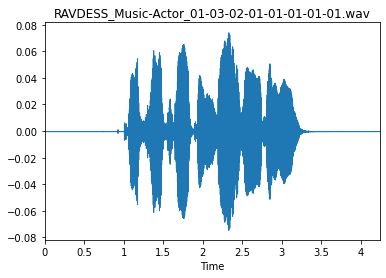

In [ ]:
data_path = "/gdrive/My Drive/datasets/ravdess_dataset/"
sample_song = data_path+"RAVDESS_Music"+"/Actor_01"+"/03-02-01-01-01-01-01.wav"

y, s = librosa.load(sample_song, duration=5)
plt.figure()
plt.title('RAVDESS_Music-Actor_01-03-02-01-01-01-01-01.wav')
plt.plot()
librosa.display.waveplot(y, sr=s)

# **Plot the Speech wave**

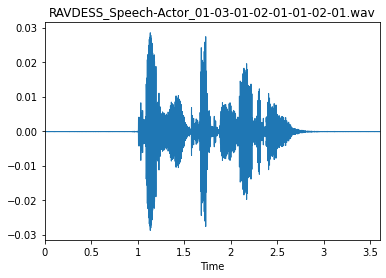

In [ ]:
data_path = "/gdrive/My Drive/datasets/ravdess_dataset/"
sample_song2 = data_path+"RAVDESS_Speech"+"/Actor_01"+"/03-01-02-01-01-02-01.wav"

y, s = librosa.load(sample_song2, duration=5)
plt.figure()
plt.title('RAVDESS_Speech-Actor_01-03-01-02-01-01-02-01.wav')
plt.plot()
librosa.display.waveplot(y, sr=s)

# **Play the wave**

# **Music**

In [ ]:
import IPython.display as ipd
ipd.Audio(sample_song)

# **Speech**

In [ ]:
ipd.Audio(sample_song2)

# **Add White Noise**

In [ ]:
y = noise(y)
ipd.Audio(y, rate=s)

# **Shift**

In [ ]:
y = shift(y)
ipd.Audio(y, rate=s)

# **Pitch**

In [ ]:
y = pitch(y, s)
ipd.Audio(y, rate=s)

# **Read audio signal with audioBasicIO, normalize the signal, convert it from stereo to mono!**

In [ ]:
data_path_test = "/gdrive/My Drive/datasets/ravdess_dataset/"
spec_folder_path_test = "/gdrive/My Drive/joblib_features/ravdess/spectrograms/speech"
[Fs, s] = audioBasicIO.read_audio_file(data_path_test+"RAVDESS_Speech"+"/Actor_01"+"/03-01-02-01-01-02-01.wav")
s = normalize_signal(s)
s = audioBasicIO.stereo_to_mono(s)

# **Plot Actor01's wav SPECTROGRAM PyAudioAnalysis**

In [ ]:
layout = go.Layout(xaxis_showgrid=False,xaxis_showticklabels=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False, yaxis_showticklabels=False, margin=dict(t=0,b=0,l=0,r=0))


#[S, t, f] = aFs.spectrogram(s, Fs, int(Fs * 0.020), int(Fs * 0.020))
#heatmap = go.Heatmap(z=S.T, y=f, x=t)
S,f,t = get_fft_spec(s, Fs, 0.02)
heatmap = go.Heatmap(z=S, y=f, x=t, colorscale='Viridis')
figure = go.Figure(data=[heatmap])
#song_name = ("03-01-02-01-01-02-01.wav")
#figure.write_image(spec_folder_path_test+song_name+'.png')
figure = {'data': [heatmap]}#, 'layout': layout}
iplot(figure)

#config = {
#  'toImageButtonOptions': {
#    'format': 'png', # one of png, svg, jpeg, webp
#    'height': 1200,
#    'width': 900,
#    'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
#  }
#}
#figure.show(config = config, renderer='svg')


# **Plot Actor01's wav MEL SPECTROGRAM PyAudioAnalysis**

In [ ]:
S = librosa.feature.melspectrogram(s, Fs, None, int(Fs * 0.020),int(Fs * 0.020), power=2)
# create frequency and time axes
f = list(range(S.shape[0]))
t = [float(t * int(Fs * 0.020)) / Fs for t in range(S.shape[1])]
heatmap = go.Heatmap(z=S, y=f, x=t, colorscale="Viridis")
figure = go.Figure(data=[heatmap])
iplot(figure)
#config = {
#  'toImageButtonOptions': {
#    'format': 'png', # one of png, svg, jpeg, webp
#    'height': 1200,
#    'width': 900,
#    'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
#  }
#}
#figure.show(config = config, renderer='svg')

# **PLOT HIST for Music/Actor01, Actor02 and Speech/Actor01, Actor02**

In [ ]:
data_path = "/gdrive/My Drive/datasets/ravdess_dataset/"
m_win, m_step, s_win, s_step = 1, 1, 0.1, 0.05

f, files, fn = directory_feature_extraction(data_path+"RAVDESS_Music"+"/Actor_01", m_win, m_step, s_win, s_step)
f2, files2, fn2 = directory_feature_extraction(data_path+"RAVDESS_Music"+"/Actor_02", m_win, m_step, s_win, s_step)
f_1, files_1, fn_1 = directory_feature_extraction(data_path+"RAVDESS_Speech"+"/Actor_01", m_win, m_step, s_win, s_step)
f_2, files_2, fn_2 = directory_feature_extraction(data_path+"RAVDESS_Speech"+"/Actor_02", m_win, m_step, s_win, s_step)

In [ ]:
plot_feature_histograms([f, f2, f_1, f_2], fn, ['music-Actor01','music-Actor02', 'speech-Actor01', 'speech-Actor02'])

Github Notebook can't show these subplots so.. 

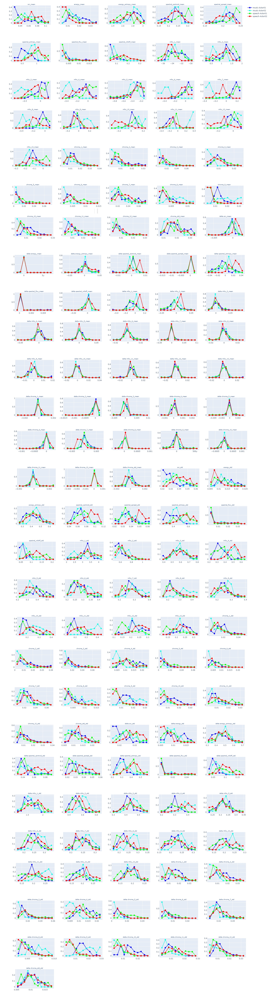

In [ ]:
img_hist = cv.imread('/gdrive/My Drive/plot_hist.jpg')
cv2_imshow(img_hist)

# **Difference in pitch in Male and Female Happy**

216
216


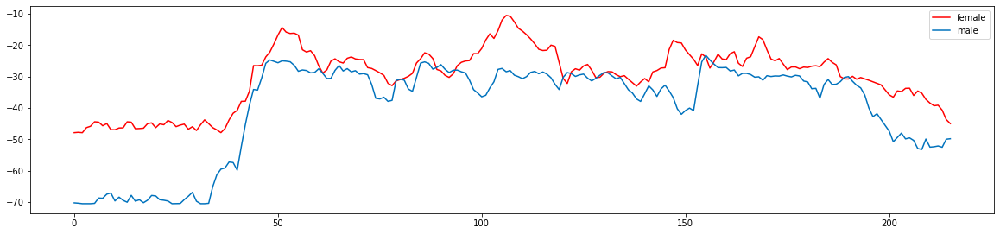

In [ ]:
data_path_test2="/gdrive/My Drive/datasets/ravdess_dataset/"
# Source - RAVDESS; Gender - Female; Emotion - Angry 
path = data_path_test2+"RAVDESS_Speech/Actor_08/03-01-05-02-01-01-08.wav"
X, sample_rate = librosa.load(path, res_type='kaiser_fast',duration=2.5,sr=22050*2,offset=0.5)  
female = librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13)
female = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13), axis=0)
print(len(female))

# Source - RAVDESS; Gender - Male; Emotion - Angry 
path = data_path_test2+"RAVDESS_Speech/Actor_09/03-01-05-01-01-01-09.wav"
X, sample_rate = librosa.load(path, res_type='kaiser_fast', duration=2.5,sr=22050*2, offset=0.5)  
male = librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13)
male = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13), axis=0)
print(len(male))

# audio wave
plt.figure(figsize=(20, 15))
plt.subplot(3,1,1)
plt.plot(female, label='female', color='red')
plt.plot(male, label='male', color=(0, 0.4470, 0.7410))
plt.legend()

# **USE JOBLIB TO SKIP THE LOADING PART**

**Save x,y**

In [ ]:
# Saving joblib files to not load them again with the loop above

x_name = 'x_speech_female_noise_shift_norm.joblib'
y_name = 'y_speech_female_noise_shift_norm.joblib'
save_dir = '/gdrive/My Drive/joblib_features/ravdess/'

savedX = joblib.dump(x_speech_female, os.path.join(save_dir, x_name))
savedy = joblib.dump(y_speech_female, os.path.join(save_dir, y_name))

**1st Method's features need dimension expanding you will find it before each neural network**

# **TEST LOAD MUSIC & SPEECH Fused Normalized(1st Method features from Feature Extraction)**

In [ ]:
# Loading saved models #only ravdess_speech
#x_music_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_music_speech_normalized.joblib')
#y_music_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_music_speech_normalized.joblib')
##################

# **Load Music Spectrograms for the first time using CV2 and create the classes(2nd Method)**

In [ ]:
#spectrograms
data_path_spec_music = '/gdrive/My Drive/joblib_features/ravdess/spectrograms_music'
data_dir_list = os.listdir(data_path_spec_music)
music_img_data_list=[]
for dataset in data_dir_list:
    img_list = os.listdir(data_path_spec_music+'/'+ dataset)
    for img in img_list:
        input_img = cv.imread(data_path_spec_music + '/' + dataset + '/'+ img )
        print('Loaded the images of dataset-' + '{}\n'.format(img))
        img_resized = cv.resize(input_img, (200, 200))
        #cv2_imshow(img_resized)
        #print('')
        music_img_data_list.append(img_resized)
print('Spectrograms have been Loaded Successfully!')
x_music_spec = np.asarray(music_img_data_list)
print('x_length:',len(x_music_spec))

#classes
spec_folder_path = "/gdrive/My Drive/joblib_features/ravdess/spectrograms_music/music_audioBasicIO/"
songs = glob.glob(spec_folder_path + "/*")
y_music_spec=[]
def extract_songname():
  for song in songs:
    i=0
    songname = os.path.basename(song)
    print('songname:',songname)
    classnames = int(songname[7:8])-1
    print('class:',classnames)
    y_music_spec.append(classnames)
    i+=1
    if(i>1011):
      print(i)
    #print(y)   

#Classes start from 0 and end to 7
extract_songname()
y_music_spec = np.asarray(y_music_spec)
print('Classes have been extracted and created successfully!')

In [ ]:
print(x_music_spec.shape, y_music_spec.shape)

(1012, 200, 200, 3) (1012,)


#**Load Speech Spectrograms for the first time using CV2 and create the classes(2nd Method)**

In [ ]:
#spectrograms
data_path_spec_speech = '/gdrive/My Drive/joblib_features/ravdess/spectrograms_speech'
data_dir_list = os.listdir(data_path_spec_speech)
speech_img_data_list=[]
for dataset in data_dir_list:
    img_list = os.listdir(data_path_spec_speech+'/'+ dataset)
    for img in img_list:
        input_img = cv.imread(data_path_spec_speech + '/' + dataset + '/'+ img )
        print('Loaded the images of dataset-' + '{}\n'.format(img))
        img_resized = cv.resize(input_img, (200, 200))
        #cv2_imshow(img_resized)
        #print('')
        speech_img_data_list.append(img_resized)
print('Spectrograms have been Loaded Successfully!')
x_speech_spec = np.asarray(speech_img_data_list)
print('x_length:',len(x_speech_spec))

#classes
spec_folder_path2 = "/gdrive/My Drive/joblib_features/ravdess/spectrograms_speech/speech2_audioBasicIO"
songs = glob.glob(spec_folder_path2 + "/*")
y_speech_spec=[]
def extract_songname2():
  for song in songs:
    j=0
    songname = os.path.basename(song)
    print('songname:',songname)
    classnames = int(songname[7:8])-1
    print('class:',classnames)
    y_speech_spec.append(classnames)
    j+=1
    if(j>1439):
      print(j)
    #print(y)

#Classes start from 0 and end to 7
extract_songname2()
y_speech_spec = np.asarray(y_speech_spec)
print('Classes have been extracted and created successfully!')

In [ ]:
print(x_speech_spec.shape, y_speech_spec.shape)

(1440, 200, 200, 3) (1440,)


# **(1st Method)**

# **LOAD MUSIC Normalized(1st Method features from Feature Extraction)**

In [ ]:
# Loading saved models #only ravdess_music
x_music = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_music_normalized.joblib')
y_music = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_music_normalized.joblib')
##################

# **SHUFFLE**

In [ ]:
#Shuffle the dataset
x_music,y_music = shuffle(x_music,y_music, random_state=123)

In [ ]:
# Split Using train_test_split
x_music_train, x_music_test, y_music_train, y_music_test = train_test_split(x_music, y_music, test_size=0.20, random_state=42)

#DTree
dtree = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

dtree.fit(x_music_train, y_music_train)

predictions = dtree.predict(x_music_test)
print('X_test:',predictions)
dot_data = StringIO()

print(classification_report(y_music_test, predictions))

#RForest
rforest = RandomForestClassifier(criterion="gini", max_depth=10, max_features="log2",
                                 max_leaf_nodes = 100, min_samples_leaf = 3, min_samples_split = 20,
                                 n_estimators= 22000, random_state= 12)

rforest.fit(x_music_train, y_music_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='log2', max_leaf_nodes=100,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, n_estimators=22000,
                       n_jobs=None, oob_score=False, random_state=12, verbose=0,
                       warm_start=False)

predictions = rforest.predict(x_music_test)

print(classification_report(y_music_test, predictions))

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:319: FutureWarning:

The parameter 'presort' is deprecated and has no effect. It will be removed in v0.24. You can suppress this warning by not passing any value to the 'presort' parameter.



X_test: [0 0 1 5 2 2 3 2 1 2 5 1 3 4 4 0 5 5 1 5 3 1 0 3 3 2 2 2 2 4 5 5 2 3 1 2 4
 3 4 5 2 2 4 2 0 3 2 1 2 4 4 5 2 3 2 5 0 3 0 3 5 1 1 5 2 0 5 4 5 2 5 2 5 0
 0 4 4 0 5 3 0 2 0 4 3 2 3 2 1 0 1 3 4 4 2 1 5 2 3 2 4 2 0 0 5 4 2 3 3 5 5
 3 1 2 2 3 4 4 1 5 1 3 0 3 0 1 2 3 3 2 1 1 0 1 3 3 4 3 2 2 2 5 2 2 1 4 4 0
 1 5 5 5 5 2 2 0 2 3 4 5 3 2 1 1 2 4 5 2 4 5 3 1 0 3 3 4 5 1 3 2 3 2 3 3 1
 5 1 1 4 2 5 2 2 4 4 1 1 5 5 5 2 2 1]
              precision    recall  f1-score   support

           0       0.68      0.83      0.75        18
           1       0.74      0.61      0.67        38
           2       0.56      0.70      0.62        40
           3       0.47      0.40      0.43        43
           4       0.54      0.50      0.52        30
           5       0.36      0.38      0.37        34

    accuracy                           0.55       203
   macro avg       0.56      0.57      0.56       203
weighted avg       0.55      0.55      0.54       203

              precision    recall  f

# **Expand dimensions of X for the neural input(1st Method)**

In [ ]:
print(x_music[0].shape)
print(x_music.shape)
x_music = np.expand_dims(x_music, axis=2)
x_music = np.expand_dims(x_music, axis=2)
print(x_music[0].shape)
print(x_music.shape)

(138,)
(1012, 138)
(138, 1, 1)
(1012, 138, 1, 1)


# **USE CONV2D**

# **This CONV2D Model works better only for Music dataset**

# **SPLIT THE DATASET USING train_test_split 80% for train 20% for test**

**filters:**	Sets the number of filters used in the convolution operation.

**kernel_size:**	Specifies the size of the convolutional filter in pixels. Must be an odd integer.

**padding='same':**	The padding parameter has two values: valid or same. Same means the input will be zero-padded, so the convolution output can be the same size as the input.

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, BatchNormalization

# Split Using train_test_split
x_music_train, x_music_test, y_music_train, y_music_test = train_test_split(x_music, y_music, test_size=0.20, random_state=42)


#for train_index, test_index in kf.split(x,y):
model = Sequential()
model.add(Conv2D(69, (5,5), activation='relu', padding='same', input_shape=(x_music_train[0].shape)))
model.add(Dropout(0.55))
model.add(MaxPool2D(pool_size=(1,1)))
model.add(Conv2D(138, (5,5), activation='relu', padding='same'))
model.add(Dropout(0.60))
model.add(Flatten())
model.add(Dense(6))
model.add(Activation('softmax'))

opt = 'Adam'
model.summary()
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
cnnhistory = model.fit(x_music_train, y_music_train, batch_size=64, epochs=1000, validation_data=(x_music_test, y_music_test))

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 138, 1, 69)        1794      
_________________________________________________________________
dropout_2 (Dropout)          (None, 138, 1, 69)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 138, 1, 69)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 138, 1, 138)       238188    
_________________________________________________________________
dropout_3 (Dropout)          (None, 138, 1, 138)       0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 19044)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                

# **Parameters Based on Dataset and accuraccies and losses**


In [ ]:
acc     = cnnhistory.history['accuracy'][-1]
val_acc = cnnhistory.history['val_accuracy'][-1]
print('acc:', acc)
print('val_acc:', val_acc)

acc: 0.9060568809509277
val_acc: 0.8128078579902649


# **PLOTS ACCURACY VS VAL_ACCURACY**

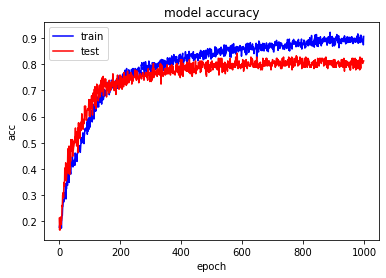

In [ ]:
plt.plot(cnnhistory.history['accuracy'], color="blue")
plt.plot(cnnhistory.history['val_accuracy'], color="red")
plt.title('model accuracy')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **PLOTS LOSS VS VAL_LOSS**

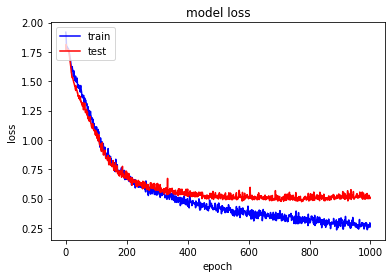

In [ ]:
plt.plot(cnnhistory.history['loss'], color="blue")
plt.plot(cnnhistory.history['val_loss'], color="red")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **CONFUSION MATRIX**

[[16  1  0  0  0  1]
 [ 0 37  1  0  0  0]
 [ 0  2 32  0  2  4]
 [ 1  0  0 33  1  8]
 [ 0  0  0  0 25  5]
 [ 0  2  2  6  2 22]]


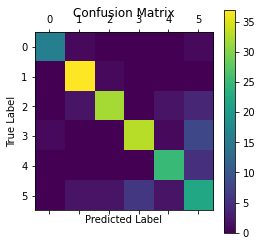

In [ ]:
predictions = model.predict_classes(x_music_test)
#print(predictions)
#print(y_music_test)
new_Ytest = y_music_test.astype(int)
cm = confusion_matrix(new_Ytest, predictions)
print (cm)

plt.matshow(cm)
plt.title('Confusion Matrix')
plt.colorbar()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# **PREDICTIONS**

In [ ]:
list1 = []
list2 = []

#predictions = np.array(int(predictions))
new_predictions = np.array(predictions)
for i in range(len(new_predictions)):
  list1.append(getLabel(new_predictions[i]))

#predictions = np.array(int(predictions))
new_y_test = np.array(y_music_test)
for i in range(len(new_y_test)):
  list2.append(getLabel(new_y_test[i]))



for i in range(len(new_y_test)):
  print('i:',i,' Real_y:', list2[i],', Predicted_y:', list1[i])
  print('')

print('(PREDICTIONS - Y)')
print(predictions)

print('(REAL - Y)')
print(y_music_test)

i: 0  Real_y: neutral , Predicted_y: neutral

i: 1  Real_y: sad , Predicted_y: sad

i: 2  Real_y: calm , Predicted_y: calm

i: 3  Real_y: angry , Predicted_y: angry

i: 4  Real_y: fearful , Predicted_y: sad

i: 5  Real_y: angry , Predicted_y: fearful

i: 6  Real_y: fearful , Predicted_y: sad

i: 7  Real_y: calm , Predicted_y: calm

i: 8  Real_y: fearful , Predicted_y: calm

i: 9  Real_y: happy , Predicted_y: happy

i: 10  Real_y: fearful , Predicted_y: fearful

i: 11  Real_y: calm , Predicted_y: calm

i: 12  Real_y: sad , Predicted_y: sad

i: 13  Real_y: angry , Predicted_y: angry

i: 14  Real_y: angry , Predicted_y: angry

i: 15  Real_y: sad , Predicted_y: sad

i: 16  Real_y: sad , Predicted_y: sad

i: 17  Real_y: angry , Predicted_y: angry

i: 18  Real_y: calm , Predicted_y: calm

i: 19  Real_y: fearful , Predicted_y: happy

i: 20  Real_y: calm , Predicted_y: happy

i: 21  Real_y: calm , Predicted_y: calm

i: 22  Real_y: neutral , Predicted_y: neutral

i: 23  Real_y: sad , Predicted_

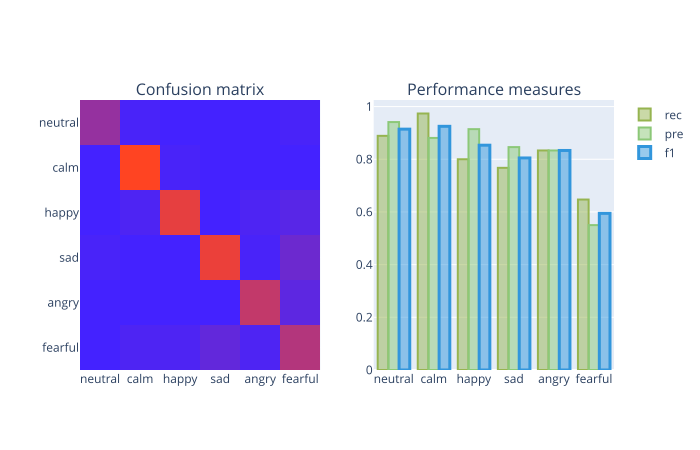

In [ ]:
plotly_classification_results(cm, ['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful'])

# **CONV2D**
This CONV2D Model, above works better only for Music dataset

**test_size=0.25, random_state=123**
in ravdess_music, batch=64, acc=92, val_acc=80, loss=0.19, val_loss=0.59, dropout=0.5

**test_size=0.20, random_state=42**
in ravdess_music_normalized, batch=64, acc=89, val_acc=83, loss=0.24, val_loss=0.49, dropout=0.55, 0.60, conv2d(58),conv2d(128)
13/13 [==============================] - 0s 8ms/step - loss: 0.2462 - accuracy: 0.8999 - val_loss: 0.4935 - val_accuracy: 0.8276

**test_size=0.20, random_state=42**
in ravdess_music_normalized, batch=64, acc=91, val_acc=87, loss=0.25, val_loss=0.44, dropout=0.55, 0.60, conv2d(69),conv2d(138)
13/13 [==============================] - 0s 15ms/step - loss: 0.2556 - accuracy: 0.9122 - val_loss: 0.4485 - val_accuracy: 0.8670

**test_size=0.30, random_state=123**
in ravdess_music,speech, batch=64, dropout=0.4, loss: 0.2862 - acc: 0.8986 - val_loss: 1.5278 - val_acc: 0.6304

#**LOAD Speech Normalized(1st Method features from Feature Extraction)**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_normalized.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_normalized.joblib')
##################

# **SHUFFLE**

In [ ]:
#Shuffle the dataset
x_speech,y_speech = shuffle(x_speech,y_speech, random_state=123)

# **Test Decision Tree, Random Forest**

In [ ]:
# Split Using train_test_split
x_speech_train, x_speech_test, y_speech_train, y_speech_test = train_test_split(x_speech, y_speech, test_size=0.2, random_state=42)

#DTree
dtree = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                                max_features=None, max_leaf_nodes=None,
                                min_impurity_decrease=0.0, min_impurity_split=None,
                                min_samples_leaf=1, min_samples_split=2,
                                min_weight_fraction_leaf=0.0, presort=False,
                                random_state=None, splitter='best')

dtree.fit(x_speech_train, y_speech_train)

predictions = dtree.predict(x_speech_test)
print('X_test:',predictions)
dot_data = StringIO()

print(classification_report(y_speech_test, predictions))

#RForest
rforest = RandomForestClassifier(criterion="gini", max_depth=10, max_features="log2",
                                 max_leaf_nodes = 100, min_samples_leaf = 3, min_samples_split = 20,
                                 n_estimators= 22000, random_state= 12)

rforest.fit(x_speech_train, y_speech_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='log2', max_leaf_nodes=100,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, n_estimators=22000,
                       n_jobs=None, oob_score=False, random_state=12, verbose=0,
                       warm_start=False)

predictions = rforest.predict(x_speech_test)

print(classification_report(y_speech_test, predictions))

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:319: FutureWarning:

The parameter 'presort' is deprecated and has no effect. It will be removed in v0.24. You can suppress this warning by not passing any value to the 'presort' parameter.



X_test: [2 3 0 3 4 5 3 3 3 6 7 6 1 7 3 7 2 1 0 7 4 6 3 7 6 5 5 5 2 4 3 2 6 4 2 4 7
 4 3 5 1 5 3 3 1 6 3 6 5 5 7 6 4 5 7 7 4 1 5 4 4 6 6 3 4 1 3 2 6 4 6 3 3 5
 2 7 3 2 0 5 5 7 6 3 7 3 2 0 4 4 7 0 5 7 4 7 3 7 4 1 3 6 4 1 4 7 3 3 5 2 2
 4 3 4 0 3 1 3 1 7 5 6 6 7 5 2 7 2 4 3 0 1 2 4 7 1 5 3 7 6 1 2 3 5 7 0 7 4
 7 3 7 5 6 7 1 3 7 5 6 6 2 6 6 1 3 1 3 6 4 6 5 4 3 3 4 5 7 6 2 5 0 6 4 6 6
 7 3 4 0 6 4 5 0 4 7 6 6 7 1 3 2 6 1 3 4 3 6 5 4 1 3 2 4 7 1 4 3 6 6 7 3 7
 7 2 4 2 7 5 2 1 6 3 1 1 5 2 5 2 6 4 0 2 4 4 2 4 3 5 2 4 3 6 1 5 4 4 5 5 7
 3 3 7 3 4 7 4 4 1 2 4 3 2 6 0 2 1 5 4 0 7 5 7 6 2 3 6 2 7]
              precision    recall  f1-score   support

           0       0.14      0.17      0.15        12
           1       0.46      0.39      0.42        31
           2       0.28      0.22      0.25        41
           3       0.16      0.24      0.19        33
           4       0.36      0.45      0.40        38
           5       0.37      0.25      0.30        52
           6       0.29     

In [ ]:
# **Expand dimensions of X for the neural input(1st Method)**
print(x_speech[0].shape)
print(x_speech.shape)
x_speech = np.expand_dims(x_speech, axis=2)
x_speech = np.expand_dims(x_speech, axis=2)
print(x_speech[0].shape)
print(x_speech.shape)

# **TEST CONV2D FOR SPEECH**

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, BatchNormalization

# Split Using train_test_split
x_speech_train, x_speech_test, y_speech_train, y_speech_test = train_test_split(x_speech, y_speech, test_size=0.2, random_state=42)


model = Sequential()
model.add(Conv2D(58, (5,5), activation='relu', padding='same', input_shape=(138, 1, 1)))
model.add(BatchNormalization())
model.add(Dropout(0.55))
model.add(MaxPool2D(pool_size=(1,1)))
model.add(Conv2D(128, (5,5), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Dropout(0.60))
model.add(Flatten())
model.add(Dense(8))
model.add(Activation('softmax'))

#Test Adam Program Schedule
STEPS_PER_EPOCH = 1152/64
lr_schedule = tensorflow.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  decay_steps=STEPS_PER_EPOCH*288,
  decay_rate=1,
  staircase=False)
def get_optimizer():
  return tensorflow.keras.optimizers.Adam(lr_schedule)

opt = 'Adam'
model.summary()
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
cnnhistory2 = model.fit(x_speech_train, y_speech_train, batch_size=64, epochs=1000, validation_data=(x_speech_test, y_speech_test))

# **Parameters Based on Dataset and accuraccies and losses**


In [ ]:
acc2     = cnnhistory2.history['accuracy'][-1]
val_acc2 = cnnhistory2.history['val_accuracy'][-1]
print('acc:', acc2)
print('val_acc:', val_acc2)

acc: 0.7777777910232544
val_acc: 0.6111111044883728


# **PLOTS ACCURACY VS VAL_ACCURACY**

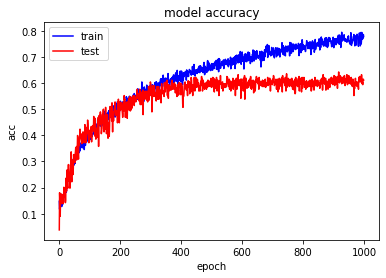

In [ ]:
plt.plot(cnnhistory2.history['accuracy'], color="blue")
plt.plot(cnnhistory2.history['val_accuracy'], color="red")
plt.title('model accuracy')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **PLOTS LOSS VS VAL_LOSS**

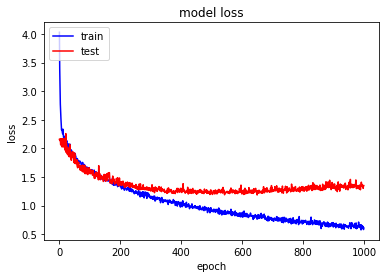

In [ ]:
plt.plot(cnnhistory2.history['loss'], color="blue")
plt.plot(cnnhistory2.history['val_loss'], color="red")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **CONFUSION MATRIX**

[[ 3  3  1  0  0  0  4  1]
 [ 0 25  2  2  0  0  1  1]
 [ 0  2 24  6  2  1  2  4]
 [ 2  4  6 15  0  2  4  0]
 [ 0  1  3  3 24  2  4  1]
 [ 0  2 11  1  2 29  4  3]
 [ 2  0  3  3  5  0 24  1]
 [ 0  0  2  1  2  4  2 32]]


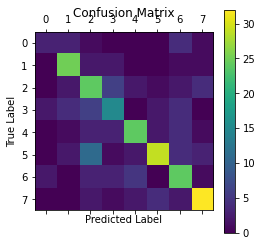

In [ ]:
predictions2 = model.predict_classes(x_speech_test)
#print(predictions)
#print(y_speech_test)
new_Ytest2 = y_speech_test.astype(int)
cm2 = confusion_matrix(new_Ytest2, predictions2)
print (cm2)

plt.matshow(cm2)
plt.title('Confusion Matrix')
plt.colorbar()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# **PREDICTIONS**

In [ ]:
list3 = []
list4 = []

#predictions = np.array(int(predictions))
new_predictions2 = np.array(predictions2)
for i in range(len(new_predictions2)):
  list3.append(getLabel(new_predictions2[i]))

#predictions = np.array(int(predictions))
new_y_test2 = np.array(y_speech_test)
for i in range(len(new_y_test2)):
  list4.append(getLabel(new_y_test2[i]))



for i in range(len(new_y_test2)):
  print('i:',i,' Real_y:', list4[i],', Predicted_y:', list3[i])
  print('')

print('(PREDICTIONS - Y)')
print(predictions2)

print('(REAL - Y)')
print(y_speech_test)

i: 0  Real_y: angry , Predicted_y: disgust

i: 1  Real_y: fearful , Predicted_y: fearful

i: 2  Real_y: disgust , Predicted_y: disgust

i: 3  Real_y: disgust , Predicted_y: disgust

i: 4  Real_y: angry , Predicted_y: angry

i: 5  Real_y: sad , Predicted_y: fearful

i: 6  Real_y: disgust , Predicted_y: disgust

i: 7  Real_y: calm , Predicted_y: calm

i: 8  Real_y: calm , Predicted_y: calm

i: 9  Real_y: fearful , Predicted_y: happy

i: 10  Real_y: disgust , Predicted_y: disgust

i: 11  Real_y: disgust , Predicted_y: disgust

i: 12  Real_y: happy , Predicted_y: happy

i: 13  Real_y: disgust , Predicted_y: disgust

i: 14  Real_y: fearful , Predicted_y: happy

i: 15  Real_y: happy , Predicted_y: happy

i: 16  Real_y: calm , Predicted_y: calm

i: 17  Real_y: calm , Predicted_y: calm

i: 18  Real_y: fearful , Predicted_y: fearful

i: 19  Real_y: calm , Predicted_y: calm

i: 20  Real_y: disgust , Predicted_y: happy

i: 21  Real_y: fearful , Predicted_y: fearful

i: 22  Real_y: surprised , Pre

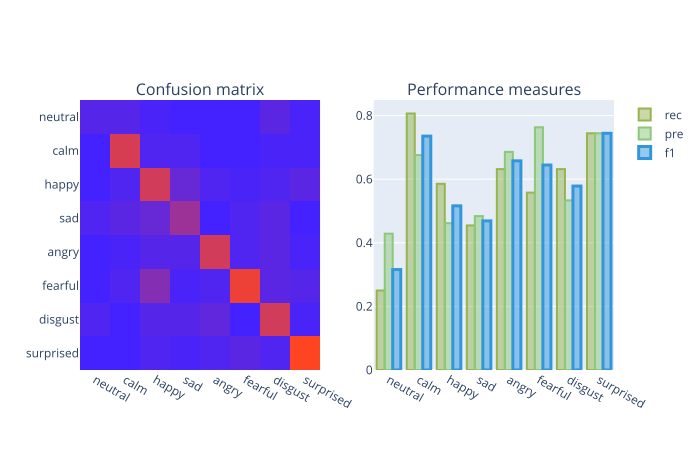

In [ ]:
plotly_classification_results(cm2, ['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful', 'disgust', 'surprised'])

# **(2nd Method)**

# **Load instantly Music Spectro from file using joblib(2ND METHOD)**

In [13]:
# Loading saved models #only ravdess_music
x_music_spectro = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_music_spectro.joblib')
y_music_spectro = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_music_spectro.joblib')
##################

# **Decision Tree, Random Forest, SVM**

In [ ]:
x_music_spectro = np.reshape(x_music_spectro, (x_music_spectro.shape[0], -1))

# Split Using train_test_split
x_music_spectro_train, x_music_spectro_test, y_music_spectro_train, y_music_spectro_test = train_test_split(x_music_spectro, y_music_spectro, test_size=0.2, random_state=42)

#DTree
dtree = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, random_state=None, splitter='best')

dtree.fit(x_music_spectro_train, y_music_spectro_train)

predictions = dtree.predict(x_music_spectro_test)
print('X_test:',predictions)
dot_data = StringIO()

print(classification_report(y_music_spectro_test, predictions))

#RForest
rforest = RandomForestClassifier(criterion="gini", max_depth=15, max_features="log2",
                                 max_leaf_nodes = 100, min_samples_leaf = 3, min_samples_split = 20,
                                 n_estimators= 22000, random_state= 12)

rforest.fit(x_music_spectro_train, y_music_spectro_train)

predictions = rforest.predict(x_music_spectro_test)

print(classification_report(y_music_spectro_test, predictions))

model_svm = SVC(kernel='rbf', C=18)
model_svm.fit(x_music_spectro_train, y_music_spectro_train)


predictions = model_svm.predict(x_music_spectro_test)

from sklearn.metrics import classification_report
print("accuracy", metrics.accuracy_score(y_true=y_music_spectro_test, y_pred=predictions))
#Confusion Matrix Metrics
print(metrics.confusion_matrix(y_true= y_music_spectro_test, y_pred= predictions))

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:319: FutureWarning:

The parameter 'presort' is deprecated and has no effect. It will be removed in v0.24. You can suppress this warning by not passing any value to the 'presort' parameter.



X_test: [5 4 2 3 3 3 2 0 5 3 2 0 4 1 4 3 1 4 5 5 0 3 0 0 3 4 0 5 4 1 0 3 1 2 5 2 1
 2 4 3 3 5 3 5 3 2 5 0 1 3 0 1 5 1 5 3 5 5 3 1 2 0 3 5 2 2 3 5 4 2 4 4 3 5
 5 2 2 2 5 2 5 1 4 5 3 0 0 3 4 2 4 2 5 5 3 5 1 2 1 1 3 4 2 0 5 4 3 1 2 3 3
 2 4 5 1 4 2 4 4 3 2 3 2 5 3 1 4 3 5 2 5 0 0 3 1 3 1 4 1 4 4 5 3 1 4 3 3 0
 5 2 2 2 2 5 1 5 3 2 2 5 5 5 5 1 3 2 0 2 4 4 1 0 3 2 1 1 1 0 5 4 3 5 1 2 3
 2 1 2 0 3 5 4 2 3 5 5 4 3 5 1 0 4 5]
              precision    recall  f1-score   support

           0       0.38      0.35      0.36        23
           1       0.62      0.46      0.53        39
           2       0.18      0.29      0.23        24
           3       0.38      0.36      0.37        44
           4       0.30      0.23      0.26        39
           5       0.14      0.18      0.16        34

    accuracy                           0.32       203
   macro avg       0.33      0.31      0.32       203
weighted avg       0.35      0.32      0.33       203



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

           0       0.00      0.00      0.00        23
           1       0.53      0.82      0.65        39
           2       0.42      0.62      0.50        24
           3       0.60      0.20      0.31        44
           4       0.69      0.69      0.69        39
           5       0.40      0.62      0.48        34

    accuracy                           0.51       203
   macro avg       0.44      0.49      0.44       203
weighted avg       0.48      0.51      0.46       203

accuracy 0.7241379310344828
[[16  0  0  5  0  2]
 [ 0 34  3  1  0  1]
 [ 0  1 21  0  1  1]
 [ 0  5  2 29  0  8]
 [ 0  0  3  2 24 10]
 [ 2  1  3  2  3 23]]


In [ ]:
#test1 = x_music_spectro[0]
#test1 = test1/255
#print("normalized)
#print(test1)

#x_music_spectro = x_music_spectro.astype('float32')
#x_music_spectro = x_music_spectro / 255

# **SHUFFLE**

In [14]:
#Shuffle the dataset
x_music_spectro,y_music_spectro = shuffle(x_music_spectro,y_music_spectro, random_state=123)

In [ ]:
print(x_music_spectro[0].shape)
print(x_music_spectro.shape)

# **Music Spectro Neural CNN(2ND METHOD USING SPECTROGRAMS)**

In [17]:
from tensorflow.keras.optimizers import SGD, Adam
random.seed(2)
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, BatchNormalization

# Split Using train_test_split
x_music_spectro_train, x_music_spectro_test, y_music_spectro_train, y_music_spectro_test = train_test_split(x_music_spectro, y_music_spectro, test_size=0.20, random_state=42)

model = Sequential()
model.add(Conv2D(input_shape=x_music_spectro_train[0].shape,filters=64,kernel_size=(3,3),strides=(2,2),padding="same", activation="relu"))
model.add(Conv2D(filters=64,kernel_size=(3,3),strides=(2,2),padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=128, kernel_size=(3,3),strides=(2,2), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=256, kernel_size=(3,3),strides=(2,2), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=512, kernel_size=(3,3),strides=(2,2), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Dropout(0.50))
model.add(Flatten())
model.add(Dense(units=520,activation="relu"))
model.add(Dropout(0.55))
model.add(Dense(units=6, activation="softmax"))


STEPS_PER_EPOCH = 809/16

lr_schedule = tensorflow.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  decay_steps=STEPS_PER_EPOCH*203,
  decay_rate=1,
  staircase=False)

def get_optimizer():
  return tensorflow.keras.optimizers.Adam(lr_schedule)

opt = 'Adam'
model.summary()
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
cnnhistory3 = model.fit(x_music_spectro_train, y_music_spectro_train, batch_size=16, epochs=100, validation_data=(x_music_spectro_test, y_music_spectro_test))

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 100, 100, 64)      1792      
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 50, 50, 64)        36928     
_________________________________________________________________
dropout_12 (Dropout)         (None, 50, 50, 64)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 25, 25, 128)       73856     
_________________________________________________________________
dropout_13 (Dropout)         (None, 25, 25, 128)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 13, 13, 256)       295168    
_________________________________________________________________
dropout_14 (Dropout)         (None, 13, 13, 256)      

# **TUNE**

In [ ]:
pip install -U keras-tuner

In [ ]:
from kerastuner.tuners import RandomSearch

import time

LOG_DIR = f"{int(time.time())}"

random.seed(2)
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, BatchNormalization

# Split Using train_test_split
x_music_spectro_train, x_music_spectro_test, y_music_spectro_train, y_music_spectro_test = train_test_split(x_music_spectro, y_music_spectro, test_size=0.20, random_state=42)
def build_model(hp):
    model = Sequential()
    model.add(Conv2D(hp.Int("Conv1",min_value=64,max_value=512,step=20), input_shape=(x_music_spectro_train[0].shape),kernel_size=(3,3),strides=(2,2),padding="same", activation='relu'))
    model.add(Dropout(hp.Float('dropout_1',
                                min_value=0.0,
                                max_value=0.5,
                                default=0.25,
                                step=0.05
                                )))
#for i in range(hp.Int("n_layers", 1, 4)):
    model.add(Conv2D(hp.Int("Conv2",min_value=64,max_value=512,step=10),kernel_size=(3,3),strides=(2,2),padding="same", activation='relu'))
    model.add(Dropout(hp.Float(
                               'dropout_2',
                                min_value=0.0,
                                max_value=0.5,
                                default=0.25,
                                step=0.05
                                )))
#for j in range(hp.Int("n_layers", 1, 4)):
    model.add(Conv2D(hp.Int("Conv3",min_value=60,max_value=250,step=10),kernel_size=(3,3),strides=(2,2),padding="same", activation='relu'))
    model.add(Dropout(hp.Float(
                            'dropout_3',
                            min_value=0.0,
                            max_value=0.5,
                            default=0.25,
                            step=0.05
                        )))

    model.add(Flatten())
    model.add(Dense(hp.Int("Dense",min_value=180,max_value=512,step=10),activation="relu"))
    model.add(Dropout(0.55))
    model.add(Dense(units=6, activation="softmax"))
    #model.summary()
    # Compile model. Stochastic gradient descent with Nesterov accelerated gradient gives good results for this model
    sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)#loss: 0.0049 - accuracy: 0.98
    adam = Adam()#loss: 0.0229 - accuracy: 0.98

    model.compile(loss='sparse_categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model


print("model trained and created")


tuner = RandomSearch(
                      build_model,
                      objective='val_accuracy',
                      max_trials = 2,
                      executions_per_trial = 1,
                      directory= '/gdrive/My Drive/joblib_features/ravdess/'
)

tuner.search(x=x_music_spectro_train,
             y=y_music_spectro_train,
             epochs=100,
             batch_size=16,
             validation_data = (x_music_spectro_test, y_music_spectro_test)
             )


#opt = 'Adam'
#model.summary()
#model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
#cnnhistory3 = model.fit(x_train, y_train, batch_size=16, epochs=100, validation_data=(x_test, y_test))

model trained and created
Epoch 1/100
51/51 [==============================] - 15s 296ms/step - loss: 21.5181 - accuracy: 0.1755 - val_loss: 1.7734 - val_accuracy: 0.1773
Epoch 2/100
51/51 [==============================] - 12s 229ms/step - loss: 1.7797 - accuracy: 0.1792 - val_loss: 1.7706 - val_accuracy: 0.1626
Epoch 3/100
51/51 [==============================] - 12s 227ms/step - loss: 1.7772 - accuracy: 0.1656 - val_loss: 1.7713 - val_accuracy: 0.1626
Epoch 4/100
51/51 [==============================] - 12s 227ms/step - loss: 1.7747 - accuracy: 0.1780 - val_loss: 1.7650 - val_accuracy: 0.1626
Epoch 5/100
51/51 [==============================] - 12s 227ms/step - loss: 1.7764 - accuracy: 0.1718 - val_loss: 1.7700 - val_accuracy: 0.1626
Epoch 6/100
51/51 [==============================] - 12s 227ms/step - loss: 1.7729 - accuracy: 0.2052 - val_loss: 1.7658 - val_accuracy: 0.1626
Epoch 7/100
51/51 [==============================] - 12s 230ms/step - loss: 1.7649 - accuracy: 0.1891 - val_l

Epoch 1/100
51/51 [==============================] - 11s 221ms/step - loss: 21.4600 - accuracy: 0.1743 - val_loss: 1.7886 - val_accuracy: 0.1724
Epoch 2/100
51/51 [==============================] - 9s 180ms/step - loss: 1.7868 - accuracy: 0.1582 - val_loss: 1.7807 - val_accuracy: 0.1626
Epoch 3/100
51/51 [==============================] - 10s 204ms/step - loss: 1.7808 - accuracy: 0.1681 - val_loss: 1.7770 - val_accuracy: 0.1773
Epoch 4/100
51/51 [==============================] - 9s 178ms/step - loss: 1.7773 - accuracy: 0.1743 - val_loss: 1.7730 - val_accuracy: 0.1626
Epoch 5/100
51/51 [==============================] - 9s 180ms/step - loss: 1.7728 - accuracy: 0.2163 - val_loss: 1.7695 - val_accuracy: 0.1626
Epoch 6/100
51/51 [==============================] - 9s 179ms/step - loss: 1.7728 - accuracy: 0.1867 - val_loss: 1.7700 - val_accuracy: 0.1626
Epoch 7/100
51/51 [==============================] - 9s 178ms/step - loss: 1.7733 - accuracy: 0.1965 - val_loss: 1.7680 - val_accuracy: 0.1

INFO:tensorflow:Oracle triggered exit


# **Parameters Based on Dataset and accuraccies and losses**

In [ ]:
acc3     = cnnhistory3.history['accuracy'][-1]
val_acc3 = cnnhistory3.history['val_accuracy'][-1]
print('acc:', acc3)
print('val_acc:', val_acc3)

acc: 0.6365883946418762
val_acc: 0.5615763664245605


# **PLOTS ACCURACY VS VAL_ACCURACY**

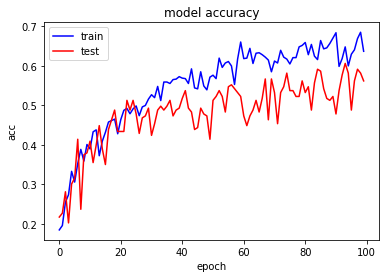

In [ ]:
plt.plot(cnnhistory3.history['accuracy'], color="blue")
plt.plot(cnnhistory3.history['val_accuracy'], color="red")
plt.title('model accuracy')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **PLOTS LOSS VS VAL_LOSS**

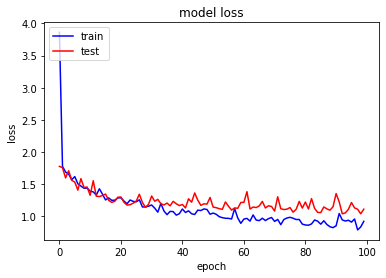

In [ ]:
plt.plot(cnnhistory3.history['loss'], color="blue")
plt.plot(cnnhistory3.history['val_loss'], color="red")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **CONFUSION MATRIX**

[[10  0  0  7  0  0]
 [ 0 38  4  0  0  0]
 [ 0 12 23  0  1  0]
 [ 3  0  0 33  1  5]
 [ 2  2  1 10 14  4]
 [ 2  2  8 12  1  8]]


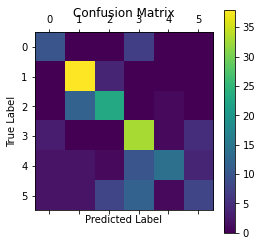

In [18]:
predictions3 = model.predict_classes(x_music_spectro_test)
#print(predictions)
#print(y_music_spectro_test)
new_Ytest3 = y_music_spectro_test.astype(int)
cm3 = confusion_matrix(new_Ytest3, predictions3)
print (cm3)

plt.matshow(cm3)
plt.title('Confusion Matrix')
plt.colorbar()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# **PREDICTIONS**

In [ ]:
list5 = []
list6 = []

#predictions = np.array(int(predictions))
new_predictions3 = np.array(predictions3)
for i in range(len(new_predictions3)):
  list5.append(getLabel(new_predictions3[i]))

#predictions = np.array(int(predictions))
new_y_test3 = np.array(y_music_spectro_test)
for i in range(len(new_y_test3)):
  list6.append(getLabel(new_y_test3[i]))



for i in range(len(new_y_test3)):
  print('i:',i,' Real_y:', list6[i],', Predicted_y:', list5[i])
  print('')

print('(PREDICTIONS - Y)')
print(predictions3)

print('(REAL - Y)')
print(y_music_spectro_test)

i: 0  Real_y: happy , Predicted_y: happy

i: 1  Real_y: happy , Predicted_y: happy

i: 2  Real_y: fearful , Predicted_y: sad

i: 3  Real_y: neutral , Predicted_y: neutral

i: 4  Real_y: sad , Predicted_y: sad

i: 5  Real_y: sad , Predicted_y: sad

i: 6  Real_y: calm , Predicted_y: happy

i: 7  Real_y: neutral , Predicted_y: neutral

i: 8  Real_y: angry , Predicted_y: angry

i: 9  Real_y: sad , Predicted_y: calm

i: 10  Real_y: happy , Predicted_y: calm

i: 11  Real_y: fearful , Predicted_y: fearful

i: 12  Real_y: angry , Predicted_y: angry

i: 13  Real_y: calm , Predicted_y: calm

i: 14  Real_y: angry , Predicted_y: angry

i: 15  Real_y: fearful , Predicted_y: fearful

i: 16  Real_y: angry , Predicted_y: fearful

i: 17  Real_y: sad , Predicted_y: sad

i: 18  Real_y: sad , Predicted_y: sad

i: 19  Real_y: happy , Predicted_y: happy

i: 20  Real_y: neutral , Predicted_y: fearful

i: 21  Real_y: angry , Predicted_y: fearful

i: 22  Real_y: fearful , Predicted_y: fearful

i: 23  Real_y: s

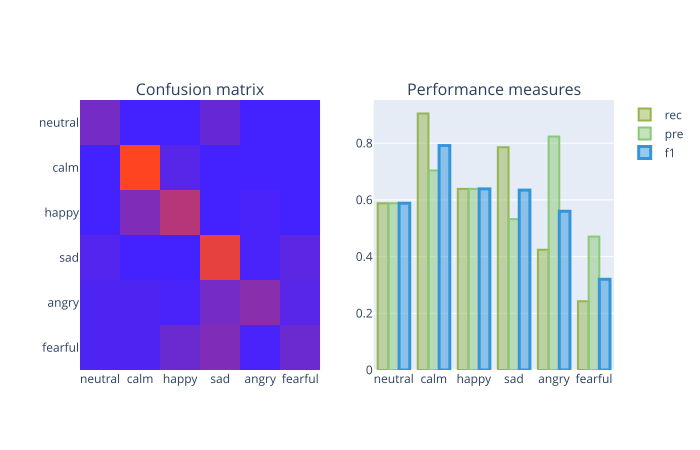

In [21]:
plotly_classification_results(cm3, ['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful'])

# **Display activation levels/ feature maps**

(200, 200, 3)
(1, 200, 200, 3)
(1, 100, 100, 64)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: RuntimeWarning:

invalid value encountered in true_divide



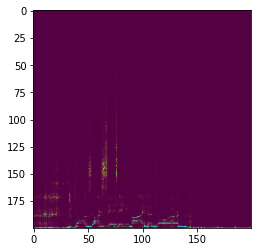

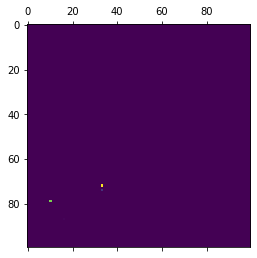

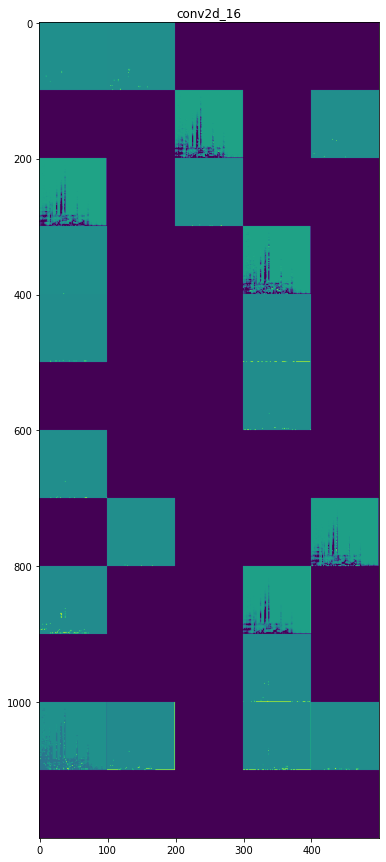

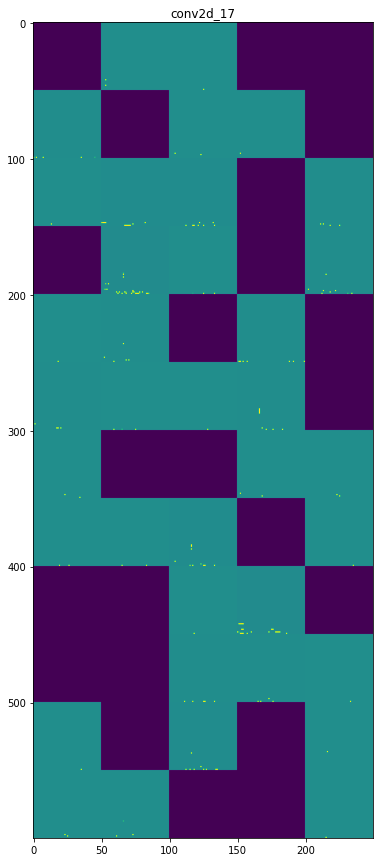

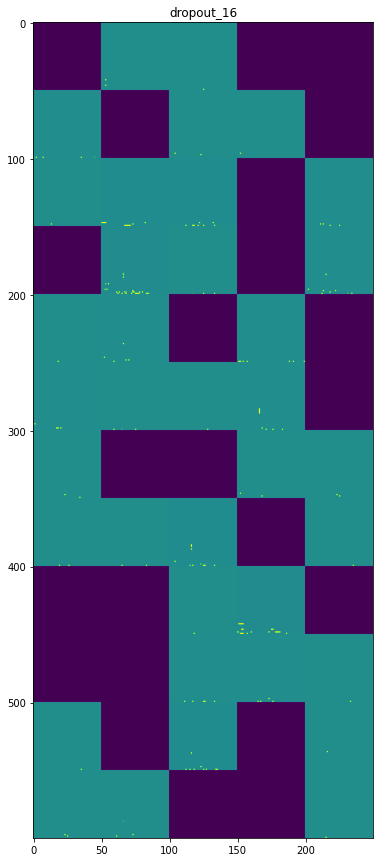

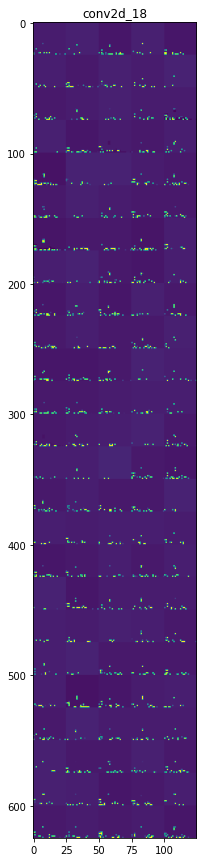

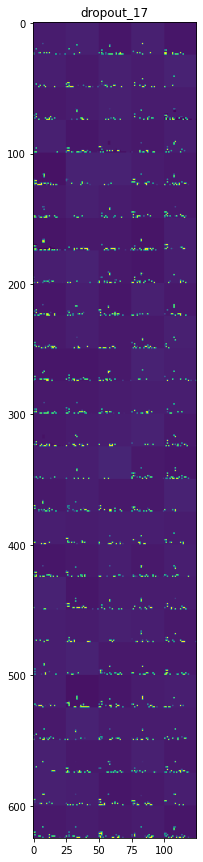

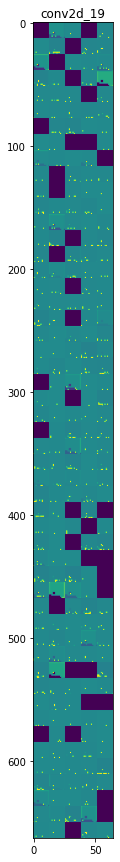

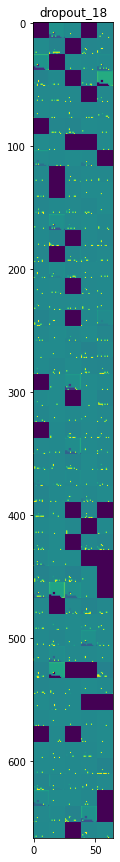

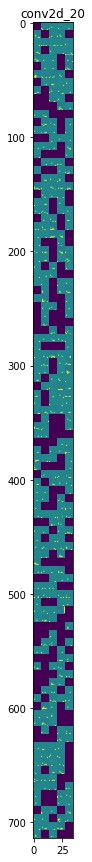

In [ ]:
from tensorflow.keras import models

# Extracts the outputs of the first layer(s)
layer_outputs = [layer.output for layer in model.layers[:]] 

# Creates a model that will return these outputs, given the model input
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

x_show3=x_music_spectro_train[98]
print(x_show3.shape)
x_show3 = np.expand_dims(x_show3, axis=0)
print(x_show3.shape)

plt.imshow(x_music_spectro_train[98])

activations = activation_model.predict(x_show3) 
len(activations)

first_layer_activation = activations[0]
print(first_layer_activation.shape)


plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')

images_per_row = 5

layer_names = []
for layer in model.layers[:]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot

for layer_name, layer_activation in zip(layer_names[:8], activations[:8]): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row #1 Tiles the activation channels in this matrix  
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(15, 15))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, cmap='viridis')

# **Load instantly Speech Spectro from file using joblib(2ND METHOD)**

In [22]:
# Loading saved models #only ravdess_music
x_speech_spectro = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_spectro.joblib')
y_speech_spectro = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_spectro.joblib')
##################

# **SHUFFLE**

In [23]:
#Shuffle the dataset
x_speech_spectro,y_speech_spectro = shuffle(x_speech_spectro,y_speech_spectro, random_state=123)

# **Decision Tree, Random Forest, SVM**

In [ ]:
x_speech_spectro = np.reshape(x_speech_spectro, (x_speech_spectro.shape[0], -1))

# Split Using train_test_split
x_pyAudio_speech_spectro_train, x_pyAudio_speech_spectro_test, y_pyAudio_speech_spectro_train, y_pyAudio_speech_spectro_test = train_test_split(x_speech_spectro, y_speech_spectro, test_size=0.2, random_state=42)

#DTree
dtree = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

dtree.fit(x_pyAudio_speech_spectro_train, y_pyAudio_speech_spectro_train)

predictions = dtree.predict(x_pyAudio_speech_spectro_test)
print('X_test:',predictions)
dot_data = StringIO()

print(classification_report(y_pyAudio_speech_spectro_test, predictions))

#RForest
rforest = RandomForestClassifier(criterion="gini", max_depth=10, max_features="log2",
                                 max_leaf_nodes = 100, min_samples_leaf = 3, min_samples_split = 20,
                                 n_estimators= 22000, random_state= 12)

rforest.fit(x_pyAudio_speech_spectro_train, y_pyAudio_speech_spectro_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='log2', max_leaf_nodes=100,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, n_estimators=22000,
                       n_jobs=None, oob_score=False, random_state=12, verbose=0,
                       warm_start=False)

predictions = rforest.predict(x_pyAudio_speech_spectro_test)

print(classification_report(y_pyAudio_speech_spectro_test, predictions))

model_svm = SVC(kernel='rbf', C=18)
model_svm.fit(x_pyAudio_speech_spectro_train, y_pyAudio_speech_spectro_train)


predictions = model_svm.predict(x_pyAudio_speech_spectro_test)

from sklearn.metrics import classification_report
print("accuracy", metrics.accuracy_score(y_true=y_pyAudio_speech_spectro_test, y_pred=predictions))
#Confusion Matrix Metrics
print(metrics.confusion_matrix(y_true= y_pyAudio_speech_spectro_test, y_pred= predictions))

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:319: FutureWarning:

The parameter 'presort' is deprecated and has no effect. It will be removed in v0.24. You can suppress this warning by not passing any value to the 'presort' parameter.



X_test: [7 3 3 2 7 6 3 2 6 2 0 3 5 1 3 1 6 3 2 6 0 6 1 2 1 4 5 5 3 3 7 7 3 7 1 2 4
 1 3 0 5 1 2 4 3 2 7 5 7 3 7 1 7 6 2 1 7 1 1 5 6 3 2 4 1 1 3 7 3 1 7 3 3 2
 5 6 7 2 5 1 0 4 5 4 3 4 7 2 3 5 0 7 1 7 1 7 4 3 2 5 4 6 2 2 4 5 1 1 2 6 5
 6 5 6 6 5 4 7 4 2 3 6 3 1 3 7 3 0 6 7 5 3 2 2 6 1 7 2 2 5 1 6 5 1 1 7 2 3
 2 7 0 3 1 1 6 1 4 1 3 3 2 3 1 7 6 5 5 7 7 0 3 1 5 1 2 0 7 4 2 7 4 3 3 3 4
 5 6 2 7 1 2 6 7 6 3 7 3 5 1 2 7 5 4 3 5 3 2 4 3 4 2 4 3 2 2 4 0 3 3 2 1 7
 1 2 4 5 5 7 1 4 7 0 1 3 0 3 1 2 1 6 4 3 2 2 3 2 4 5 0 3 4 2 6 3 7 6 4 4 6
 3 3 4 4 2 2 1 2 7 7 0 6 1 2 6 2 2 5 6 2 5 7 1 5 4 2 1 2 4]
              precision    recall  f1-score   support

           0       0.14      0.09      0.11        23
           1       0.42      0.39      0.40        46
           2       0.22      0.31      0.26        36
           3       0.10      0.16      0.12        31
           4       0.31      0.26      0.29        38
           5       0.39      0.29      0.33        41
           6       0.24     

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

           0       0.00      0.00      0.00        23
           1       0.33      0.43      0.37        46
           2       0.29      0.17      0.21        36
           3       0.21      0.23      0.22        31
           4       0.41      0.47      0.44        38
           5       0.50      0.41      0.45        41
           6       0.31      0.42      0.36        31
           7       0.30      0.38      0.34        42

    accuracy                           0.34       288
   macro avg       0.29      0.31      0.30       288
weighted avg       0.31      0.34      0.32       288

accuracy 0.5034722222222222
[[10  3  0  5  0  0  0  5]
 [ 4 29  3  5  0  1  2  2]
 [ 0  2 16  4  1  4  2  7]
 [ 4  6  1 14  1  1  0  4]
 [ 0  2  1  4 18  2  4  7]
 [ 1  2  2  6  4 16  2  8]
 [ 0  5  2  1  2  2 17  2]
 [ 1  0  3  3  2  4  4 25]]


# **Speech Spectro Neural CNN(2ND METHOD USING SPECTROGRAMS)**

In [25]:
random.seed(2)
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, BatchNormalization

# Split Using train_test_split
x_speech_spectro_train, x_speech_spectro_test, y_speech_spectro_train, y_speech_spectro_test = train_test_split(x_speech_spectro, y_speech_spectro, test_size=0.20, random_state=42)

model = Sequential()
model.add(Conv2D(input_shape=x_speech_spectro_train[0].shape,filters=64,kernel_size=(3,3),strides=(2,2),padding="same", activation="relu"))
model.add(Conv2D(filters=64,kernel_size=(3,3),strides=(2,2),padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=128, kernel_size=(3,3),strides=(2,2), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=256, kernel_size=(3,3),strides=(2,2), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=512, kernel_size=(3,3),strides=(2,2), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(units=512,activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(units=8, activation="softmax"))

opt = 'Adam'
model.summary()
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
cnnhistory4 = model.fit(x_speech_spectro_train, y_speech_spectro_train, batch_size=16, epochs=100, validation_data=(x_speech_spectro_test, y_speech_spectro_test))

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 100, 100, 64)      1792      
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 50, 50, 64)        36928     
_________________________________________________________________
dropout_24 (Dropout)         (None, 50, 50, 64)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 25, 25, 128)       73856     
_________________________________________________________________
dropout_25 (Dropout)         (None, 25, 25, 128)       0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 13, 13, 256)       295168    
_________________________________________________________________
dropout_26 (Dropout)         (None, 13, 13, 256)      

# **Parameters Based on Dataset and accuraccies and losses**

In [ ]:
acc4     = cnnhistory4.history['accuracy'][-1]
val_acc4 = cnnhistory4.history['val_accuracy'][-1]
print('acc:', acc4)
print('val_acc:', val_acc4)

acc: 0.6623263955116272
val_acc: 0.4027777910232544


# **PLOTS ACCURACY VS VAL_ACCURACY**

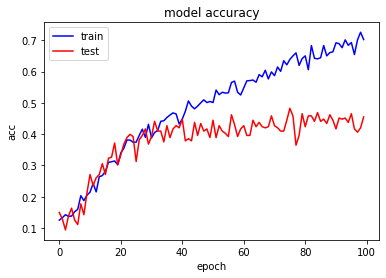

In [ ]:
plt.plot(cnnhistory4.history['accuracy'], color="blue")
plt.plot(cnnhistory4.history['val_accuracy'], color="red")
plt.title('model accuracy')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **PLOTS LOSS VS VAL_LOSS**

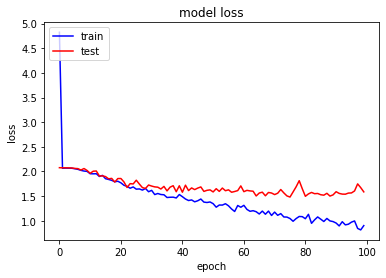

In [ ]:
plt.plot(cnnhistory4.history['loss'], color="blue")
plt.plot(cnnhistory4.history['val_loss'], color="red")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **CONFUSION MATRIX**

[[ 4  4  2  8  0  1  0  4]
 [ 4 26  1  9  1  1  0  4]
 [ 0  2 13  6  2  4  1  8]
 [ 0  9  1 16  1  2  0  2]
 [ 0  3  2  8 14  4  1  6]
 [ 0  3  2  8  1 22  2  3]
 [ 0  2  4  8  3  3  9  2]
 [ 1  4  5  8  5  6  0 13]]


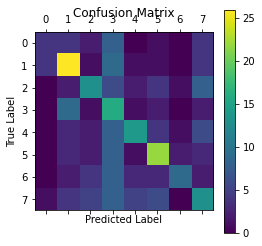

In [26]:
predictions4 = model.predict_classes(x_speech_spectro_test)
#print(predictions)
#print(y_speech_spectro_test)
new_Ytest4 = y_speech_spectro_test.astype(int)
cm4 = confusion_matrix(new_Ytest4, predictions4)
print (cm4)

plt.matshow(cm4)
plt.title('Confusion Matrix')
plt.colorbar()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# **PREDICTIONS**

In [ ]:
list7 = []
list8 = []

#predictions = np.array(int(predictions))
new_predictions4 = np.array(predictions4)
for i in range(len(new_predictions4)):
  list7.append(getLabel(new_predictions4[i]))

#predictions = np.array(int(predictions))
new_y_test4 = np.array(y_speech_spectro_test)
for i in range(len(new_y_test4)):
  list8.append(getLabel(new_y_test4[i]))



for i in range(len(new_y_test4)):
  print('i:',i,' Real_y:', list8[i],', Predicted_y:', list7[i])
  print('')

print('(PREDICTIONS - Y)')
print(predictions4)

print('(REAL - Y)')
print(y_speech_spectro_test)

i: 0  Real_y: surprised , Predicted_y: surprised

i: 1  Real_y: surprised , Predicted_y: happy

i: 2  Real_y: neutral , Predicted_y: neutral

i: 3  Real_y: calm , Predicted_y: disgust

i: 4  Real_y: surprised , Predicted_y: angry

i: 5  Real_y: disgust , Predicted_y: disgust

i: 6  Real_y: happy , Predicted_y: fearful

i: 7  Real_y: sad , Predicted_y: happy

i: 8  Real_y: angry , Predicted_y: calm

i: 9  Real_y: surprised , Predicted_y: surprised

i: 10  Real_y: calm , Predicted_y: calm

i: 11  Real_y: neutral , Predicted_y: neutral

i: 12  Real_y: angry , Predicted_y: happy

i: 13  Real_y: calm , Predicted_y: calm

i: 14  Real_y: neutral , Predicted_y: surprised

i: 15  Real_y: sad , Predicted_y: sad

i: 16  Real_y: calm , Predicted_y: calm

i: 17  Real_y: angry , Predicted_y: sad

i: 18  Real_y: surprised , Predicted_y: angry

i: 19  Real_y: angry , Predicted_y: angry

i: 20  Real_y: calm , Predicted_y: calm

i: 21  Real_y: surprised , Predicted_y: fearful

i: 22  Real_y: sad , Predi

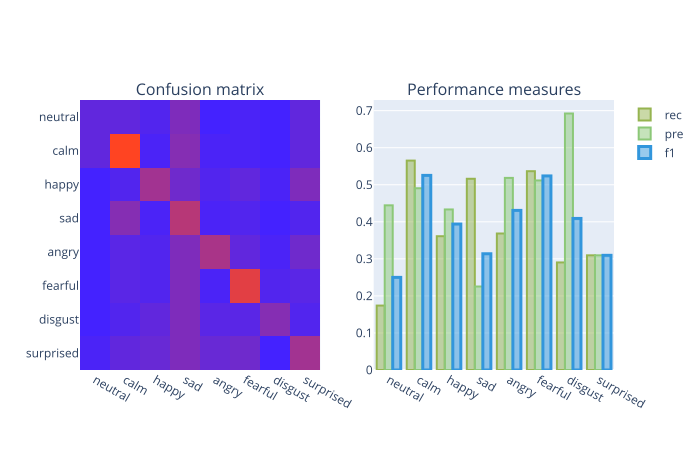

In [27]:
plotly_classification_results(cm4, ['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful', 'disgust', 'surprised'])

 # **Testing some other architectures**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_normalized.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_normalized.joblib')
##################

# **TEST GRU LAYERS FOR SPEECH**

In [ ]:
#Shuffle the dataset
x_speech,y_speech = shuffle(x_speech,y_speech, random_state=123)

In [ ]:
print(x_speech[0].shape)
print(x_speech.shape)
x_speech = np.expand_dims(x_speech, axis=2)
print(x_speech[0].shape)
print(x_speech.shape)

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPool2D, MaxPooling2D, LSTM, GRU

# Split Using train_test_split
x_speech_train, x_speech_test, y_speech_train, y_speech_test = train_test_split(x_speech, y_speech, test_size=0.20, random_state=123)


#for train_index, test_index in kf.split(x,y):
model = Sequential()
model.add(GRU(276, activation='relu', input_shape=(138, 1), return_sequences = True))
model.add(Dropout(0.4))
#model.add(MaxPool2D(pool_size=(1,1)))
model.add(GRU(138, activation='relu', return_sequences = True))
model.add(Dropout(0.5))
model.add(GRU(69, activation='relu', return_sequences = True))
model.add(Dropout(0.4))
model.add(Dense(138, activation='relu'))  
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(8))
model.add(Activation('softmax'))

opt = 'Adam'
model.summary()
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
cnnhistory5 = model.fit(x_speech_train, y_speech_train, batch_size=200, epochs=500, validation_data=(x_speech_test, y_speech_test))

acc     = cnnhistory5.history['accuracy']
val_acc = cnnhistory5.history['val_accuracy']
#print('acc', acc)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_6 (GRU)                  (None, 138, 276)          231012    
_________________________________________________________________
dropout_18 (Dropout)         (None, 138, 276)          0         
_________________________________________________________________
gru_7 (GRU)                  (None, 138, 138)          172224    
_________________________________________________________________
dropout_19 (Dropout)         (None, 138, 138)          0         
_________________________________________________________________
gru_8 (GRU)                  (None, 138, 69)           43263     
_________________________________________________________________
dropout_20 (Dropout)         (None, 138, 69)           0         
_________________________________________________________________
dense_15 (Dense)             (None, 138, 138)         

# **USE CONV1D**

# **TEST MUSIC OR SPEECH (1ST Method)**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_normalized.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_normalized.joblib')
##################

# **SPLIT THE DATASET USING KFOLD**

In [ ]:
#Shuffle the dataset
x_speech,y_speech = shuffle(x_speech,y_speech, random_state=123)

In [ ]:
print(x_speech[0].shape)
print(x_speech.shape)
x_speech = np.expand_dims(x_speech, axis=2)
print(x_speech[0].shape)
print(x_speech.shape)

(138,)
(1440, 138)
(138, 1)
(1440, 138, 1)


In [ ]:
i=0
# Split Using Kfold
k_folds=5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=123)
for train_index, test_index in kf.split(x,y):
    x_speech_train, x_speech_test = x_speech[train_index], x_speech[test_index]
    y_speech_train, y_speech_test = y_speech[train_index], y_speech[test_index]

    # Split Using train_test_split
    #x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=123)
    # Extend dimensions
    #x_traincnn = np.expand_dims(x_train, axis=2)
    #x_testcnn = np.expand_dims(x_test, axis=2)
    #print(x_traincnn.shape, x_testcnn.shape)


    #for train_index, test_index in kf.split(x,y):
    model = Sequential()
    model.add(Conv1D(69, 5, activation='relu', padding='same', input_shape=(138,1)))
    #model.add(Dense(58, activation='relu', input_shape=(138, 1)))
    model.add(Dropout(0.2))
    model.add(MaxPool1D(pool_size=(5)))
    model.add(Conv1D(138, 5, activation='relu', padding='same'))
    #model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(8))
    model.add(Activation('softmax'))

    opt = 'Adam'
    model.summary()
    model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
    cnnhistory6 = model.fit(x_speech_train, y_speech_train, batch_size=17, epochs=800, validation_data=(x_speech_test, y_speech_test))

    acc     = cnnhistory6.history['accuracy']
    val_acc = cnnhistory6.history['val_accuracy']
    i=i+1
    #print('acc', acc)
print('i:',i)

Streaming output truncated to the last 5000 lines.
Epoch 738/800
68/68 [==============================] - 0s 4ms/step - loss: 0.6384 - accuracy: 0.7778 - val_loss: 1.7926 - val_accuracy: 0.4479
Epoch 739/800
68/68 [==============================] - 0s 3ms/step - loss: 0.7008 - accuracy: 0.7500 - val_loss: 1.8271 - val_accuracy: 0.4167
Epoch 740/800
68/68 [==============================] - 0s 4ms/step - loss: 0.6880 - accuracy: 0.7465 - val_loss: 1.8013 - val_accuracy: 0.4028
Epoch 741/800
68/68 [==============================] - 0s 4ms/step - loss: 0.6505 - accuracy: 0.7760 - val_loss: 1.7365 - val_accuracy: 0.4444
Epoch 742/800
68/68 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.7691 - val_loss: 1.7727 - val_accuracy: 0.4236
Epoch 743/800
68/68 [==============================] - 0s 4ms/step - loss: 0.6437 - accuracy: 0.7639 - val_loss: 1.7343 - val_accuracy: 0.4444
Epoch 744/800
68/68 [==============================] - 0s 3ms/step - loss: 0.6654 - accurac

# **Test Male-Female Seperately with noise_shift_norm or Test MaleFemale for 16 classes instead of 8 (Pitch showed that it worsens the training)**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_augmented_mf.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_augmented_mf.joblib')
##################

**OR**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_augmented.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_augmented.joblib')
##################

**OR**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_speech_female_noise_shift_norm.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_speech_female_noise_shift_norm.joblib')
##################

**OR**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_speech_male_noise_shift_norm.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_speech_male_noise_shift_norm.joblib')
##################

**OR**

In [ ]:
# Loading saved models #only ravdess_speech
x_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/x_pyAudio_speech_noise_shift.joblib')
y_speech = joblib.load('/gdrive/My Drive/joblib_features/ravdess/y_pyAudio_speech_noise_shift.joblib')
##################

In [ ]:
print(x_speech.shape)

In [ ]:
# Split Using train_test_split
x_speech_train, x_speech_test, y_speech_train, y_speech_test = train_test_split(x_speech, y_speech, test_size=0.2, random_state=42)

#DTree
dtree = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                                max_features=None, max_leaf_nodes=None,
                                min_impurity_decrease=0.0, min_impurity_split=None,
                                min_samples_leaf=1, min_samples_split=2,
                                min_weight_fraction_leaf=0.0, presort=False,
                                random_state=None, splitter='best')

dtree.fit(x_speech_train, y_speech_train)

predictions = dtree.predict(x_speech_test)
print('X_test:',predictions)
dot_data = StringIO()

print(classification_report(y_speech_test, predictions))

#RForest
rforest = RandomForestClassifier(criterion="gini", max_depth=10, max_features="log2",
                                 max_leaf_nodes = 100, min_samples_leaf = 3, min_samples_split = 20,
                                 n_estimators= 22000, random_state= 12)

rforest.fit(x_speech_train, y_speech_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='log2', max_leaf_nodes=100,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, n_estimators=22000,
                       n_jobs=None, oob_score=False, random_state=12, verbose=0,
                       warm_start=False)

predictions = rforest.predict(x_speech_test)

print(classification_report(y_speech_test, predictions))

model_svm = SVC(kernel='rbf', C=18)
#THIS IS FOR 16 CLASSES
#model_svm = SVC(kernel='linear', C=50)
model_svm.fit(x_speech_train, y_speech_train)


predictions = model_svm.predict(x_speech_test)

from sklearn.metrics import classification_report
print("accuracy", metrics.accuracy_score(y_true=y_speech_test, y_pred=predictions))
#Confusion Matrix Metrics
print(metrics.confusion_matrix(y_true= y_speech_test, y_pred= predictions))
print(classification_report(y_speech_test, predictions))

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:319: FutureWarning:

The parameter 'presort' is deprecated and has no effect. It will be removed in v0.24. You can suppress this warning by not passing any value to the 'presort' parameter.



X_test: [6 1 1 1 2 6 1 5 6 1 2 6 6 5 5 6 4 2 6 5 2 3 1 1 5 0 7 0 7 3 4 4 5 2 1 4 7
 5 4 3 5 1 1 7 6 1 6 4 4 4 7 2 7 7 1 1 1 6 6 0 3 4 0 5 5 4 6 2 6 1 3 4 7 4
 7 1 4 7 3 6 2 4 4 0 2 4 4 1 2 1 4 1 4 7 2 0 6 2 2 2 3 5 3 7 7 6 5 1 2 2 7
 6 7 6 0 3 5 6 6 5 7 1 5 5 3 7 2 1 2 4 6 7 1 7 5 1 1 1 3 5 5 3 4 6 3 5 5 1
 0 2 5 4 1 6 2 1 0 1 3 4 0 0 4 1 1 4 7 1 2 7 1 5 4 4 3 3 4 2 4 1 2 4 4 1 3
 6 3 4 7 3 0 4 1 1 3 0 3 2 4 1 7 1 2 0 6 2 1 3 2 4 5 4 5 4 6 6 0 4 7 4 6 3
 3 1 1 6 6 6 3 5 0 2 3 3 7 5 5 4 4 1 3 0 5 0 4 3 4 6 3 2 7 6 0 1 3 4 2 3 1
 3 6 3 1 6 4 6 4 5 7 1 0 1 6 7 6 3 0 7 6 5 6 4 5 6 2 4 1 1]
              precision    recall  f1-score   support

           0       0.10      0.10      0.10        20
           1       0.51      0.59      0.55        44
           2       0.26      0.24      0.25        34
           3       0.20      0.18      0.19        39
           4       0.25      0.29      0.27        42
           5       0.31      0.31      0.31        32
           6       0.20     

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.47      0.82      0.60        44
           2       0.28      0.24      0.25        34
           3       0.44      0.28      0.34        39
           4       0.51      0.45      0.48        42
           5       0.41      0.41      0.41        32
           6       0.21      0.41      0.28        32
           7       0.70      0.42      0.53        45

    accuracy                           0.41       288
   macro avg       0.38      0.38      0.36       288
weighted avg       0.42      0.41      0.40       288

accuracy 0.1597222222222222
[[ 0  2  1  9  0  0  8  0]
 [ 0  7  0 21  0  0 16  0]
 [ 0  6  1 18  0  0  9  0]
 [ 0  7  0 20  0  0 12  0]
 [ 0  1  0 21  0  0 20  0]
 [ 0  2  0 17  0  0 13  0]
 [ 0  2  0 12  0  0 18  0]
 [ 0  7  0 24  1  0 13  0]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

